# 9.2 Sigma Sweep Full Run (3D z, biological_sigma=0.1)

Simulated data now follows the 07/24 meeting directives: 3D z-space (`n_z_dims=3`), batch shift normalized by `sqrt(n_z_dims)`, no separate zero-shift baseline batch, and the model's own latent size (`dim_z`) matched to `n_z_dims` so model capacity doesn't dominate. Uses `train_and_compute_rho` from `simulated_data_pipeline_aug1.py`.

Adds V-space integration metrics (iLISI, graph connectivity, batch silhouette via `scib_metrics`) alongside the Z-space batch-separation check, so both halves of the mentor's ask are covered: Z should separate batch, V should not.

## Import modules

In [1]:
import sys
sys.path.insert(0, "/Users/alanxie/CodingProjects/Columbia/Azizi Lab/Spatial Nut Carcinoma/decipher-bc-methods/Data/Simulated Data/Simulated Data Generation")

from simulated_data_pipeline_aug1 import train_and_compute_rho

/Users/alanxie/miniconda3/envs/decipher_env/lib/python3.11/site-packages/torch/cuda/__init__.py:54: FutureWarning: The pynvml package is deprecated. Please install nvidia-ml-py instead. If you did not install pynvml directly, please report this to the maintainers of the package that installed pynvml for you.
  import pynvml  # type: ignore[import]


## Create simulated data and train models

Epoch 284 (batch 22/22) | | train elbo: 90.81 (last epoch: 90.75) | val ll: 91.31:  28%|██▊       | 284/1000 [01:08<02:52,  4.16it/s]2026-08-03 08:17:06,630 | INFO : Early stopping has been triggered.
2026-08-03 08:17:06,632 | INFO : Added `.obsm['decipher_v']`: the Decipher v space.
2026-08-03 08:17:06,632 | INFO : Added `.obsm['decipher_z']`: the Decipher z space.
2026-08-03 08:17:06,633 | INFO : Saving decipher model with run_id 2026-08-03-08-17-06-simmered-charcoal-optical.


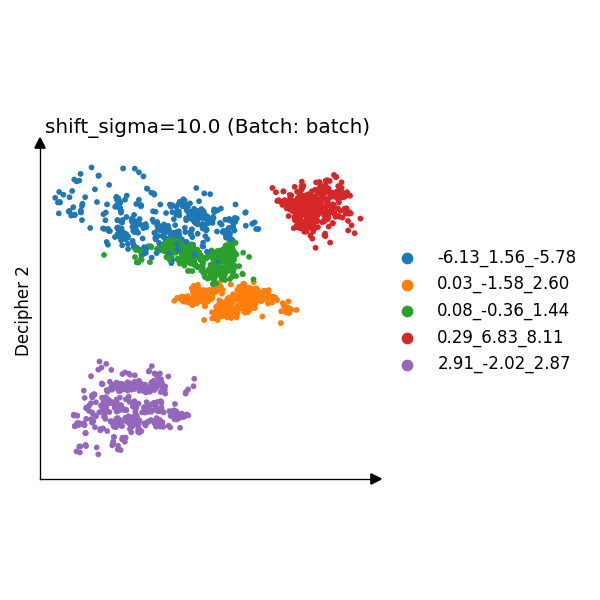

/Users/alanxie/miniconda3/envs/decipher_env/lib/python3.11/site-packages/anndata/_core/anndata.py:1754: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")
... storing 'shift' as categorical
2026-08-03 08:17:07,746 | INFO : Clustering cells using scanpy Leiden algorithm.
2026-08-03 08:17:07,746 | INFO : Step 1: Computing neighbors with `sc.pp.neighbors`, with the representation decipher_z.
2026-08-03 08:17:07,768 | INFO : Step 2: Computing clusters with `sc.tl.leiden`, and resolution 0.05.
2026-08-03 08:17:07,919 | INFO : Added `.obs['decipher_clusters']`: the cluster labels.
/Users/alanxie/CodingProjects/Columbia/Azizi Lab/Spatial Nut Carcinoma/decipher-bc-methods/Data/Simulated Data/Simulated Data Generation/simulated_data_pipeline_aug1.py:312: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current beh

,model,sigma,seed,rho,trained_h5ad
0,Base Decipher,0.1,0,0.763952,/Users/alanxie/CodingProjects/Columbia/Azizi L...
1,Base Decipher,0.1,1,0.902658,/Users/alanxie/CodingProjects/Columbia/Azizi L...
2,Base Decipher,0.1,2,0.825585,/Users/alanxie/CodingProjects/Columbia/Azizi L...
3,Base Decipher,0.1,3,0.990523,/Users/alanxie/CodingProjects/Columbia/Azizi L...
4,Base Decipher,0.1,4,0.973000,/Users/alanxie/CodingProjects/Columbia/Azizi L...
...,...,...,...,...,...
135,Decipher-MF,10.0,0,0.113243,/Users/alanxie/CodingProjects/Columbia/Azizi L...
136,Decipher-MF,10.0,1,0.204100,/Users/alanxie/CodingProjects/Columbia/Azizi L...
137,Decipher-MF,10.0,2,0.070927,/Users/alanxie/CodingProjects/Columbia/Azizi L...
138,Decipher-MF,10.0,3,0.296157,/Users/alanxie/CodingProjects/Columbia/Azizi L...


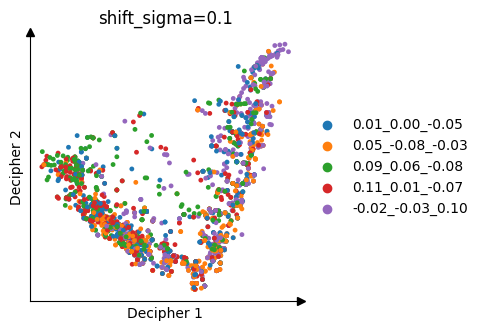

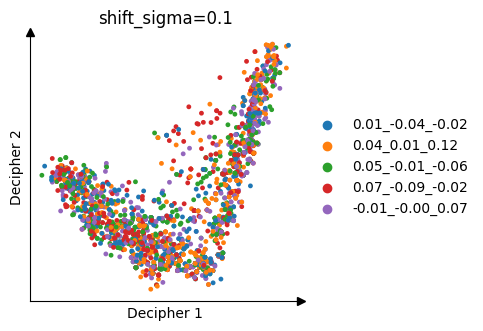

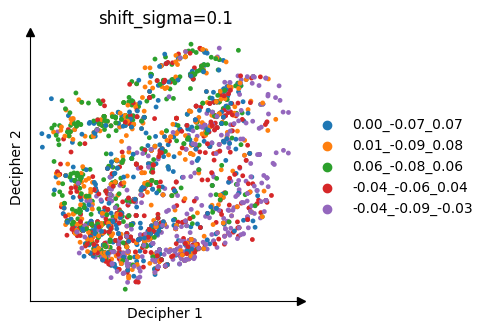

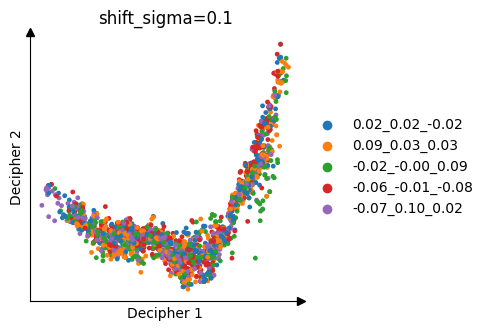

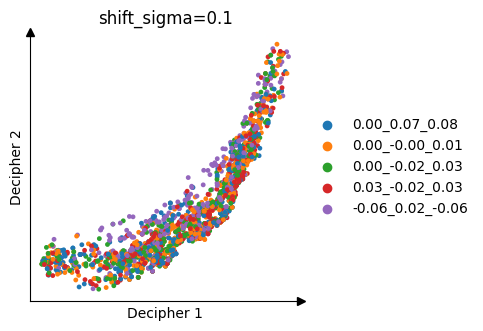

...

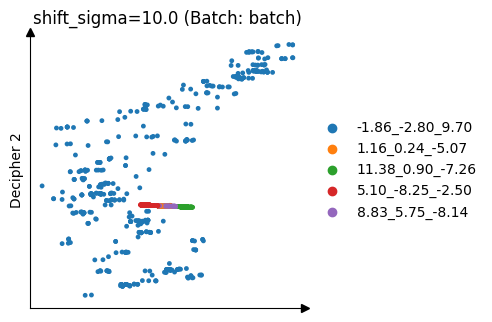

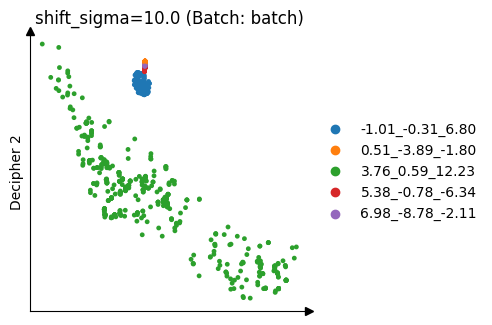

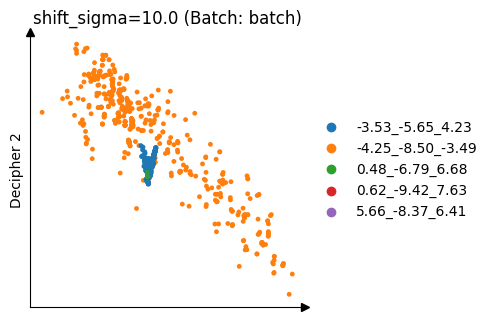

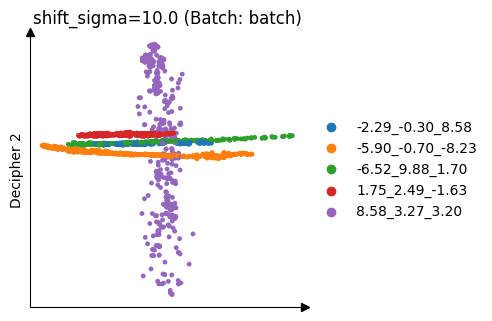

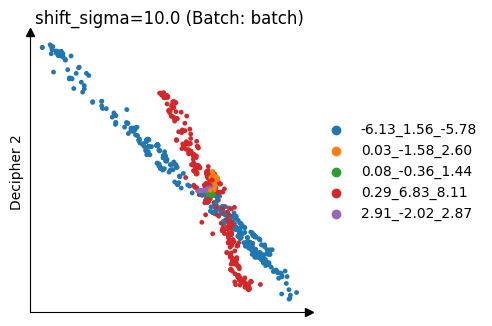

In [2]:
import os
import pandas as pd

results_dir = "/Users/alanxie/CodingProjects/Columbia/Azizi Lab/Spatial Nut Carcinoma/decipher-bc-methods/Data/Simulated Data/Simulated Adata/shift_sigma_sweep"
os.makedirs(results_dir, exist_ok=True)

models = {
    "Base Decipher": "decipher",
    "Decipher-VZ": "decipher_vz",
    "Decipher-VZ2": "decipher_vz2",
    "Decipher-MF": "decipher_mf",
}

n_z_dims = 3
biological_sigma = 0.1
sigmas = [0.1, 0.5, 1.0, 2.0, 5.0, 7.5, 10.0]
seeds = [0, 1, 2, 3, 4]
decipher_seed = 1

results_csv_path = os.path.join(results_dir, "sigma_sweep_results_3dz.csv")
records = []
for model_name, model_tag in models.items():
    for sigma in sigmas:
        for seed in seeds:
            try:
                rho, trained_path, adata = train_and_compute_rho(
                    model_tag, decipher_seed,
                    shift_sigma=sigma,
                    biological_sigma=biological_sigma,
                    seed=seed,
                    n_z_dims=n_z_dims,
                )
                records.append({
                    "model": model_name,
                    "sigma": sigma,
                    "seed": seed,
                    "rho": rho,
                    "trained_h5ad": trained_path,
                })
            except Exception as e:
                print(f"[{model_name}] sigma={sigma} seed={seed} failed: {type(e).__name__}: {e}")
            # Write after every run so a failure partway through the sweep doesn't lose
            # already-completed results.
            pd.DataFrame(records).to_csv(results_csv_path, index=False)

results_df = pd.DataFrame(records)
results_df

## Correlation Plot

2026-08-03 11:32:26,747 | INFO : Substituting symbol N from STIXNonUnicode
2026-08-03 11:32:26,767 | INFO : Substituting symbol N from STIXNonUnicode
2026-08-03 11:32:26,818 | INFO : Substituting symbol N from STIXNonUnicode
2026-08-03 11:32:26,842 | INFO : Substituting symbol N from STIXNonUnicode


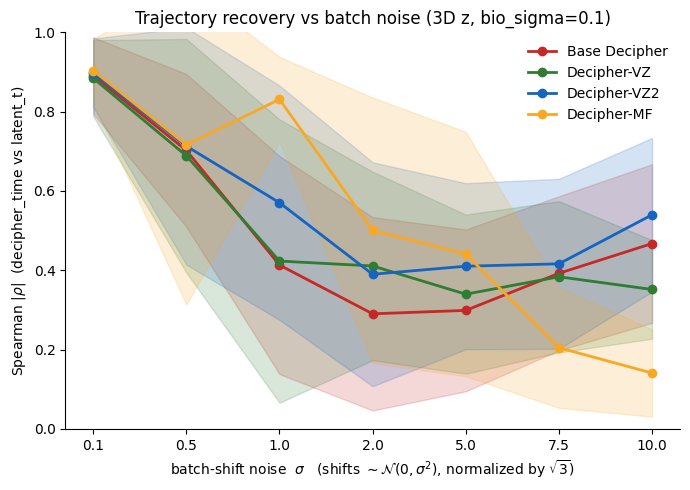

In [3]:
import numpy as np
import matplotlib.pyplot as plt

colors = {
    "Decipher-VZ": "#2E7D32",
    "Decipher-VZ2": "#1565C0",
    "Decipher-MF": "#F9A825",
    "Base Decipher": "#C62828",
}

sigmas_sorted = sorted(results_df["sigma"].unique())
x_pos = np.arange(len(sigmas_sorted))  # evenly spaced positions, one per sigma tested

fig, ax = plt.subplots(figsize=(7, 5))
for name in models:
    sub = results_df[results_df["model"] == name]
    stats = sub.groupby("sigma")["rho"].agg(["mean", "std"]).reindex(sigmas_sorted)
    mean = stats["mean"].to_numpy()
    sd_ = stats["std"].to_numpy()
    ax.plot(x_pos, mean, marker="o", color=colors[name], label=name, linewidth=2)
    ax.fill_between(x_pos, mean - sd_, mean + sd_, color=colors[name], alpha=0.18)

ax.set_xticks(x_pos)
ax.set_xticklabels([str(s) for s in sigmas_sorted])
ax.set_xlabel(r"batch-shift noise  $\sigma$   (shifts $\sim \mathcal{N}(0,\sigma^2)$, normalized by $\sqrt{3}$)")
ax.set_ylabel(r"Spearman $|\rho|$  (decipher_time vs latent_t)")
ax.set_title("Trajectory recovery vs batch noise (3D z, bio_sigma=0.1)")
ax.set_ylim(0, 1); ax.axhline(0, color="0.8", lw=0.8)
ax.legend(frameon=False); ax.spines[["top", "right"]].set_visible(False)
fig.tight_layout()
fig.savefig("sigma_vs_correlation_3dz.png", dpi=200)
plt.show()

In [4]:
rho_summary = results_df.groupby("sigma")["rho"].agg(["mean", "std"]).reindex(sigmas_sorted).round(3)
rho_summary

,mean,std
sigma,,
0.1,0.894,0.083
0.5,0.705,0.281
1.0,0.559,0.306
2.0,0.398,0.266
5.0,0.372,0.223
7.5,0.349,0.194
10.0,0.375,0.215


## V-space integration metrics (scib_metrics)

The mentor's check: Z-space should separate batch (silhouette high), V-space should *not* (batches should mix). iLISI, graph connectivity, and (rescaled) batch silhouette are all oriented so **higher = better integration** here — reused verbatim from Jihyun's `compute_integration_metrics` in `9.1 new_metric_exploration.ipynb`.

In [5]:
import scanpy as sc

def compute_integration_metrics(adata,
                                v_key="decipher_v", batch_key="batch", t_key="latent_t",
                                n_neighbors=30, n_bins=5):
    from scib_metrics.nearest_neighbors import pynndescent
    from scib_metrics import ilisi_knn, graph_connectivity, silhouette_batch
    import pandas as pd
    import numpy as np
    adata.obs["latent_t_bin"] = pd.qcut(
        adata.obs[t_key], q=n_bins, labels=False
    ).astype("category")
    neigh = pynndescent(adata.obsm[v_key], n_neighbors=n_neighbors)
    batches = adata.obs[batch_key].cat.codes.to_numpy()
    bins    = adata.obs["latent_t_bin"].cat.codes.to_numpy()
    return {
        "ilisi": ilisi_knn(neigh, batches, scale=True),
        "graph_conn": graph_connectivity(neigh, labels=bins),
        "sil_batch": silhouette_batch(adata.obsm[v_key], labels=bins, batch=batches, rescale=True),
    }

In [6]:
v_records = []
for _, row in results_df.iterrows():
    adata = sc.read_h5ad(row["trained_h5ad"])
    m = compute_integration_metrics(adata, v_key="decipher_v", batch_key="batch", t_key="latent_t",
                                     n_neighbors=30, n_bins=5)
    m.update({"model": row["model"], "sigma": row["sigma"], "seed": row["seed"]})
    v_records.append(m)

v_results_df = pd.DataFrame(v_records)
v_results_df.to_csv(os.path.join(results_dir, "v_space_integration_metrics_3dz.csv"), index=False)
v_results_df

/Users/alanxie/miniconda3/envs/decipher_env/lib/python3.11/site-packages/anndata/_core/anndata.py:1754: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")
INFO:2026-08-03 11:32:32,109:jax._src.xla_bridge:822: Unable to initialize backend 'tpu': INTERNAL: Failed to open libtpu.so: dlopen(libtpu.so, 0x0001): tried: 'libtpu.so' (no such file), '/System/Volumes/Preboot/Cryptexes/OSlibtpu.so' (no such file), '/Users/alanxie/miniconda3/envs/decipher_env/bin/../lib/libtpu.so' (no such file), '/usr/lib/libtpu.so' (no such file, not in dyld cache), 'libtpu.so' (no such file)
2026-08-03 11:32:32,109 | INFO : Unable to initialize backend 'tpu': INTERNAL: Failed to open libtpu.so: dlopen(libtpu.so, 0x0001): tried: 'libtpu.so' (no such file), '/System/Volumes/Preboot/Cryptexes/OSlibtpu.so' (no such file), '/Users/alanxie/miniconda3/envs/decipher_env/bin/../lib/libtpu.so' (no such file), '/usr/lib/libtpu.so' (no suc

,ilisi,graph_conn,sil_batch,model,sigma,seed
0,4.924242e-01,0.5168,0.790723,Base Decipher,0.1,0
1,5.383998e-01,0.7928,0.853382,Base Decipher,0.1,1
2,5.149568e-01,0.7464,0.851783,Base Decipher,0.1,2
3,4.991215e-01,0.9844,0.850420,Base Decipher,0.1,3
4,5.121704e-01,0.9312,0.874899,Base Decipher,0.1,4
...,...,...,...,...,...,...
135,8.940697e-08,0.1564,0.471369,Decipher-MF,10.0,0
136,1.192093e-07,0.1832,0.427937,Decipher-MF,10.0,1
137,1.192093e-07,0.1760,0.458229,Decipher-MF,10.0,2
138,1.788139e-07,0.2800,0.458045,Decipher-MF,10.0,3


### V-space metrics vs sigma

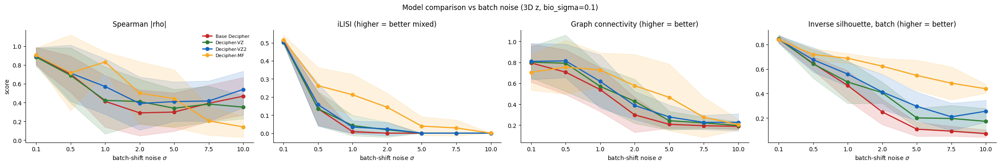

In [7]:
fig, axes = plt.subplots(1, 4, figsize=(24, 4))
panels = [
    ("rho", "Spearman |rho|", results_df),
    ("ilisi", "iLISI (higher = better mixed)", v_results_df),
    ("graph_conn", "Graph connectivity (higher = better)", v_results_df),
    ("sil_batch", "Inverse silhouette, batch (higher = better)", v_results_df),
]
for ax, (col, title, df) in zip(axes, panels):
    for name in models:
        sub = df[df["model"] == name]
        stats = sub.groupby("sigma")[col].agg(["mean", "std"]).reindex(sigmas_sorted)
        mean = stats["mean"].to_numpy()
        sd_ = stats["std"].to_numpy()
        ax.plot(x_pos, mean, marker="o", color=colors[name], label=name, linewidth=2)
        ax.fill_between(x_pos, mean - sd_, mean + sd_, color=colors[name], alpha=0.15)
    ax.set_xticks(x_pos)
    ax.set_xticklabels([str(s) for s in sigmas_sorted])
    ax.set_xlabel(r"batch-shift noise $\sigma$")
    ax.set_title(title)
    ax.spines[["top", "right"]].set_visible(False)
axes[0].set_ylabel("score")
axes[0].legend(frameon=False, fontsize=8)
fig.suptitle("Model comparison vs batch noise (3D z, bio_sigma=0.1)")
fig.tight_layout()
fig.savefig("v_space_metrics_vs_sigma_3dz.png", dpi=200)
plt.show()

In [8]:
v_summary = (v_results_df
    .groupby(["model", "sigma"])[["ilisi", "graph_conn", "sil_batch"]]
    .agg(["mean", "std"]).round(3))
v_summary

ilisi        graph_conn        sil_batch       
                      mean    std       mean    std      mean    std
model         sigma                                                 
Base Decipher 0.1    0.511  0.018      0.794  0.183     0.844  0.032
              0.5    0.135  0.090      0.706  0.214     0.645  0.055
              1.0    0.008  0.010      0.540  0.209     0.466  0.121
              2.0    0.000  0.000      0.299  0.167     0.250  0.103
              5.0    0.000  0.000      0.208  0.036     0.110  0.058
              7.5    0.000  0.000      0.195  0.021     0.094  0.040
              10.0   0.000  0.000      0.189  0.028     0.074  0.030
Decipher-MF   0.1    0.515  0.028      0.705  0.170     0.838  0.013
              0.5    0.262  0.101      0.754  0.257     0.718  0.048
              1.0    0.212  0.113      0.729  0.162     0.688  0.039
              2.0    0.143  0.078      0.577  0.299     0.623  0.063
              5.0    0.039  0.052      0.466  0.319     0.547  0.125
              7.5    0.029  0.044      0.276  0.191     0.485  0.134
              10.0   0.000  0.000      0.206  0.051     0.439  0.037
Decipher-VZ   0.1    0.502  0.007      0.802  0.149     0.846  0.032
              0.5    0.134  0.095      0.792  0.270     0.642  0.117
              1.0    0.042  0.056      0.570  0.188     0.494  0.175
              2.0    0.019  0.041      0.428  0.211     0.407  0.087
              5.0    0.000  0.000      0.243  0.089     0.202  0.078
              7.5    0.000  0.000      0.222  0.056     0.197  0.107
              10.0   0.000  0.000      0.196  0.035     0.174  0.105
Decipher-VZ2  0.1    0.504  0.013      0.809  0.173     0.840  0.029
              0.5    0.157  0.118      0.814  0.160     0.675  0.100
              1.0    0.033  0.035      0.618  0.254     0.559  0.099
              2.0    0.023  0.037      0.389  0.134     0.413  0.144
              5.0    0.000  0.000      0.278  0.115     0.296  0.115
              7.5    0.000  0.000      0.227  0.069     0.210  0.112
              10.0   0.000  0.000      0.227  0.083     0.256  0.089

## Z-space quality: ground truth vs. learned decipher_z (batch silhouette + UMAP), highest sigma

In [9]:
from sklearn.metrics import silhouette_score

def load_run(results_df, sigma, model_name, seed=None):
    sub = results_df[(results_df["sigma"] == sigma) & (results_df["model"] == model_name)]
    if seed is not None:
        sub = sub[sub["seed"] == seed]
    row = sub.iloc[0]
    return row, sc.read_h5ad(row["trained_h5ad"])

/Users/alanxie/miniconda3/envs/decipher_env/lib/python3.11/site-packages/anndata/_core/anndata.py:1754: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


Base Decipher  sigma=10.0  ground truth z silhouette (by batch) = 0.9580
Base Decipher  sigma=10.0  learned decipher_z silhouette (by batch) = 0.9413


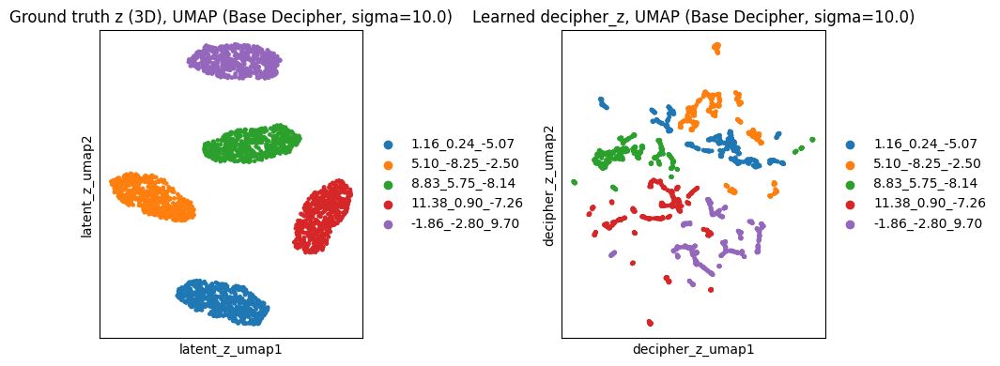

/Users/alanxie/miniconda3/envs/decipher_env/lib/python3.11/site-packages/anndata/_core/anndata.py:1754: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


Decipher-VZ  sigma=10.0  ground truth z silhouette (by batch) = 0.9580
Decipher-VZ  sigma=10.0  learned decipher_z silhouette (by batch) = 0.9457


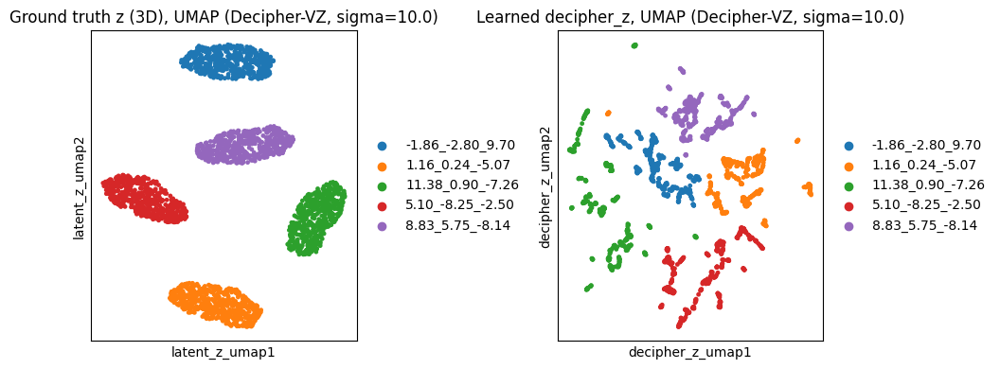

/Users/alanxie/miniconda3/envs/decipher_env/lib/python3.11/site-packages/anndata/_core/anndata.py:1754: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


Decipher-VZ2  sigma=10.0  ground truth z silhouette (by batch) = 0.9580
Decipher-VZ2  sigma=10.0  learned decipher_z silhouette (by batch) = 0.9172


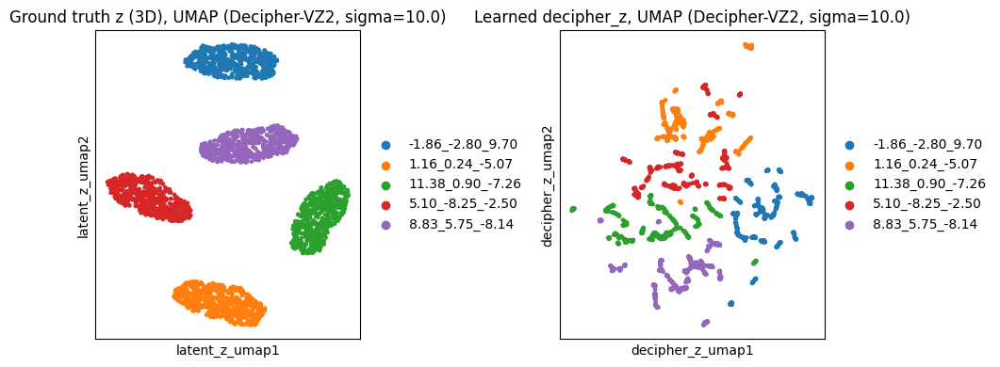

/Users/alanxie/miniconda3/envs/decipher_env/lib/python3.11/site-packages/anndata/_core/anndata.py:1754: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


Decipher-MF  sigma=10.0  ground truth z silhouette (by batch) = 0.9580
Decipher-MF  sigma=10.0  learned decipher_z silhouette (by batch) = 0.9218


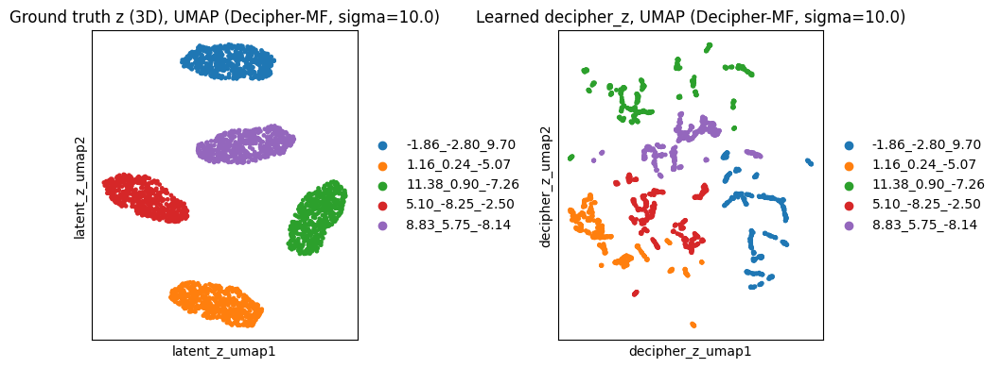

In [10]:
latent_z_cols = ["latent_z0", "latent_z1", "latent_z2"]
sigma_max = max(sigmas_sorted)

for model_name in models:
    row, adata = load_run(results_df, sigma_max, model_name)
    batch_labels = adata.obs["batch"].astype(str)

    sil_ground_truth = silhouette_score(
        adata.obs[latent_z_cols].values, batch_labels,
        sample_size=min(5000, adata.n_obs), random_state=42,
    )
    sil_learned = silhouette_score(
        adata.obsm["decipher_z"], batch_labels,
        sample_size=min(5000, adata.n_obs), random_state=42,
    )
    print(f"{model_name}  sigma={sigma_max}  ground truth z silhouette (by batch) = {sil_ground_truth:.4f}")
    print(f"{model_name}  sigma={sigma_max}  learned decipher_z silhouette (by batch) = {sil_learned:.4f}")

    adata.obsm["latent_z"] = adata.obs[latent_z_cols].values
    sc.pp.neighbors(adata, use_rep="latent_z", key_added="latent_z_neighbors", random_state=42)
    sc.tl.umap(adata, neighbors_key="latent_z_neighbors", random_state=42)
    adata.obsm["latent_z_umap"] = adata.obsm["X_umap"]

    sc.pp.neighbors(adata, use_rep="decipher_z", random_state=42)
    sc.tl.umap(adata, random_state=42)
    adata.obsm["decipher_z_umap"] = adata.obsm["X_umap"]

    fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(10, 4))
    sc.pl.embedding(adata, basis="latent_z_umap", color="batch",
                    ax=axes[0], show=False, title=f"Ground truth z (3D), UMAP ({model_name}, sigma={sigma_max})")
    sc.pl.embedding(adata, basis="decipher_z_umap", color="batch",
                    ax=axes[1], show=False, title=f"Learned decipher_z, UMAP ({model_name}, sigma={sigma_max})")
    plt.tight_layout()
    plt.show()

## Per-sigma detail: latent vs. learned pseudotime, ground truth vs. inferred z, V-space integration

In [11]:
model_names = list(models.keys())
seed_for_detail = 0

### Sigma = 0.1

In [12]:
sigma = 0.1
runs = {name: load_run(results_df, sigma, name, seed=seed_for_detail) for name in model_names}

/Users/alanxie/miniconda3/envs/decipher_env/lib/python3.11/site-packages/anndata/_core/anndata.py:1754: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")
/Users/alanxie/miniconda3/envs/decipher_env/lib/python3.11/site-packages/anndata/_core/anndata.py:1754: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")
/Users/alanxie/miniconda3/envs/decipher_env/lib/python3.11/site-packages/anndata/_core/anndata.py:1754: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")
/Users/alanxie/miniconda3/envs/decipher_env/lib/python3.11/site-packages/anndata/_core/anndata.py:1754: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


#### Latent vs. learned pseudotime

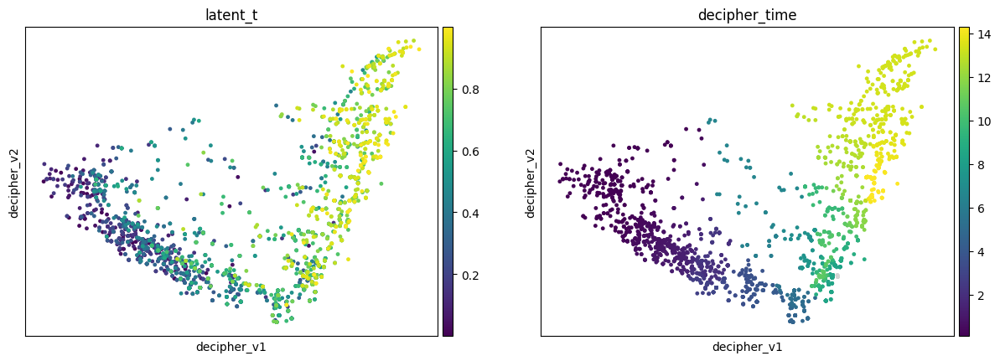

Base Decipher, sigma=0.1, seed=0, rho = 0.7640


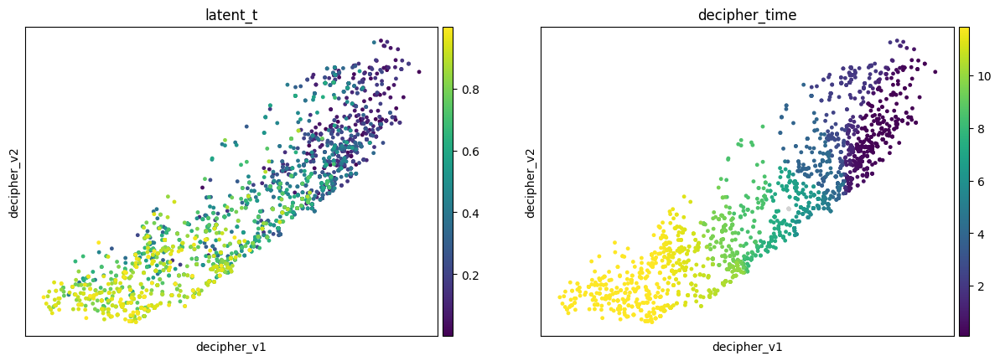

Decipher-VZ, sigma=0.1, seed=0, rho = 0.7815


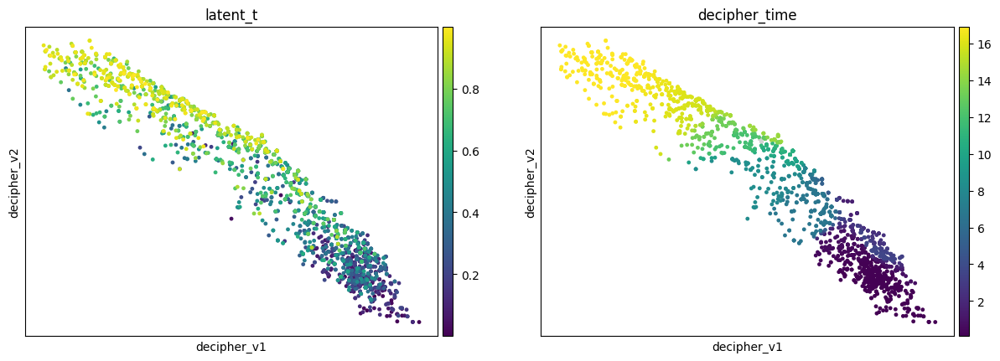

Decipher-VZ2, sigma=0.1, seed=0, rho = 0.7952


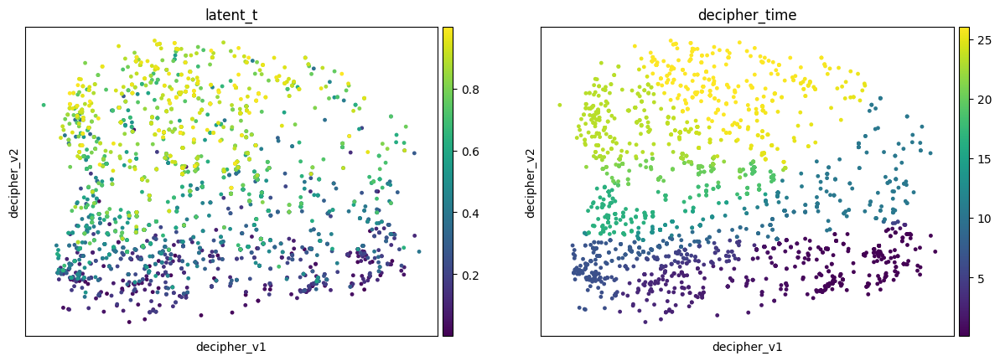

Decipher-MF, sigma=0.1, seed=0, rho = 0.7993


In [13]:
for model_name, (row, adata) in runs.items():
    sc.pl.embedding(adata, basis="decipher_v", color=["latent_t", "decipher_time"])
    print(f"{model_name}, sigma={sigma}, seed={row['seed']}, rho = {row['rho']:.4f}")

#### Ground truth vs. inferred z

Base Decipher  sigma=0.1  ground truth z silhouette (by batch) = -0.0378
Base Decipher  sigma=0.1  learned decipher_z silhouette (by batch) = -0.0799


/Users/alanxie/miniconda3/envs/decipher_env/lib/python3.11/site-packages/scipy/sparse/_index.py:151: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


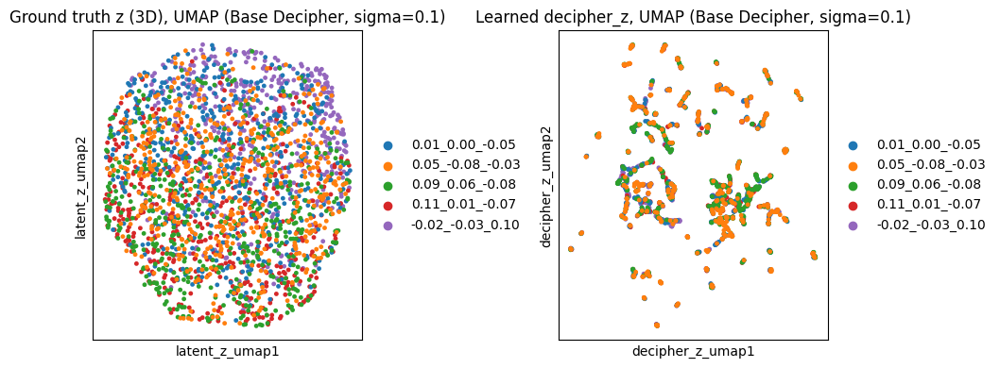

Decipher-VZ  sigma=0.1  ground truth z silhouette (by batch) = -0.0378
Decipher-VZ  sigma=0.1  learned decipher_z silhouette (by batch) = -0.0891


/Users/alanxie/miniconda3/envs/decipher_env/lib/python3.11/site-packages/scipy/sparse/_index.py:151: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


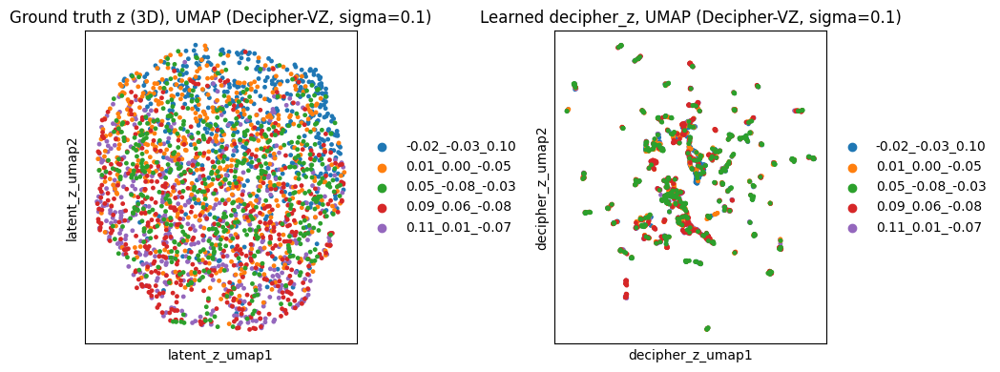

Decipher-VZ2  sigma=0.1  ground truth z silhouette (by batch) = -0.0378
Decipher-VZ2  sigma=0.1  learned decipher_z silhouette (by batch) = -0.0863


/Users/alanxie/miniconda3/envs/decipher_env/lib/python3.11/site-packages/scipy/sparse/_index.py:151: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


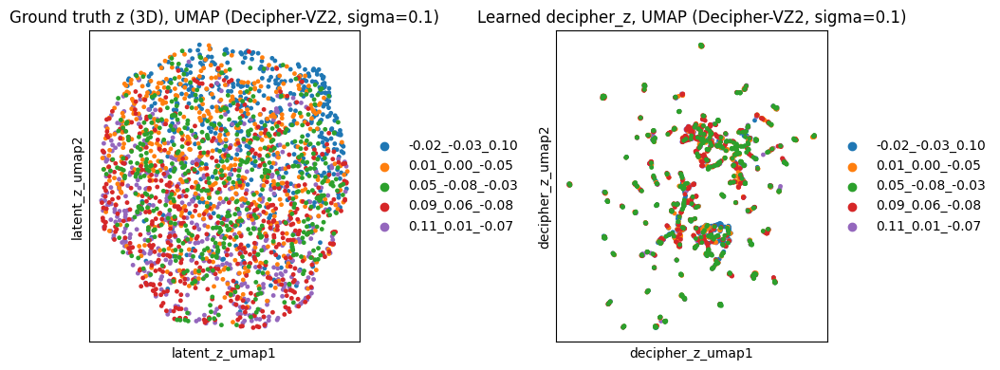

Decipher-MF  sigma=0.1  ground truth z silhouette (by batch) = -0.0378
Decipher-MF  sigma=0.1  learned decipher_z silhouette (by batch) = -0.0751


/Users/alanxie/miniconda3/envs/decipher_env/lib/python3.11/site-packages/scipy/sparse/_index.py:151: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


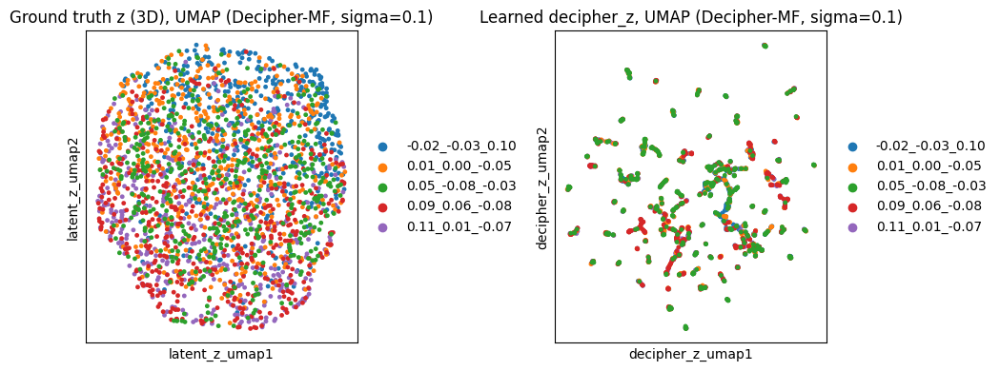

In [14]:
for model_name, (row, adata) in runs.items():
    batch_labels = adata.obs["batch"].astype(str)

    sil_ground_truth = silhouette_score(
        adata.obs[latent_z_cols].values, batch_labels,
        sample_size=min(5000, adata.n_obs), random_state=42,
    )
    sil_learned = silhouette_score(
        adata.obsm["decipher_z"], batch_labels,
        sample_size=min(5000, adata.n_obs), random_state=42,
    )
    print(f"{model_name}  sigma={sigma}  ground truth z silhouette (by batch) = {sil_ground_truth:.4f}")
    print(f"{model_name}  sigma={sigma}  learned decipher_z silhouette (by batch) = {sil_learned:.4f}")

    adata.obsm["latent_z"] = adata.obs[latent_z_cols].values
    sc.pp.neighbors(adata, use_rep="latent_z", key_added="latent_z_neighbors", random_state=42)
    sc.tl.umap(adata, neighbors_key="latent_z_neighbors", random_state=42)
    adata.obsm["latent_z_umap"] = adata.obsm["X_umap"]

    sc.pp.neighbors(adata, use_rep="decipher_z", random_state=42)
    sc.tl.umap(adata, random_state=42)
    adata.obsm["decipher_z_umap"] = adata.obsm["X_umap"]

    fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(10, 4))
    sc.pl.embedding(adata, basis="latent_z_umap", color="batch",
                    ax=axes[0], show=False, title=f"Ground truth z (3D), UMAP ({model_name}, sigma={sigma})")
    sc.pl.embedding(adata, basis="decipher_z_umap", color="batch",
                    ax=axes[1], show=False, title=f"Learned decipher_z, UMAP ({model_name}, sigma={sigma})")
    plt.tight_layout()
    plt.show()

#### V-space integration (scib_metrics)

In [15]:
for model_name, (row, adata) in runs.items():
    m = compute_integration_metrics(adata, v_key="decipher_v", batch_key="batch", t_key="latent_t",
                                     n_neighbors=30, n_bins=5)
    print(f"{model_name}  sigma={sigma}  seed={row['seed']}  "
          f"iLISI={m['ilisi']:.4f}  graph_conn={m['graph_conn']:.4f}  sil_batch={m['sil_batch']:.4f}")

Base Decipher  sigma=0.1  seed=0  iLISI=0.4924  graph_conn=0.5168  sil_batch=0.7907
Decipher-VZ  sigma=0.1  seed=0  iLISI=0.5028  graph_conn=0.5720  sil_batch=0.7925
Decipher-VZ2  sigma=0.1  seed=0  iLISI=0.5091  graph_conn=0.5248  sil_batch=0.7906
Decipher-MF  sigma=0.1  seed=0  iLISI=0.4858  graph_conn=0.5124  sil_batch=0.8288


### Sigma = 0.5

In [16]:
sigma = 0.5
runs = {name: load_run(results_df, sigma, name, seed=seed_for_detail) for name in model_names}

/Users/alanxie/miniconda3/envs/decipher_env/lib/python3.11/site-packages/anndata/_core/anndata.py:1754: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")
/Users/alanxie/miniconda3/envs/decipher_env/lib/python3.11/site-packages/anndata/_core/anndata.py:1754: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")
/Users/alanxie/miniconda3/envs/decipher_env/lib/python3.11/site-packages/anndata/_core/anndata.py:1754: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")
/Users/alanxie/miniconda3/envs/decipher_env/lib/python3.11/site-packages/anndata/_core/anndata.py:1754: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


#### Latent vs. learned pseudotime

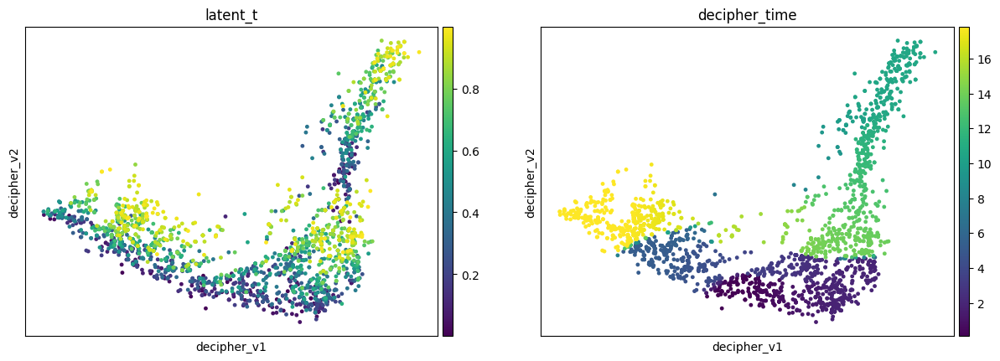

Base Decipher, sigma=0.5, seed=0, rho = 0.4222


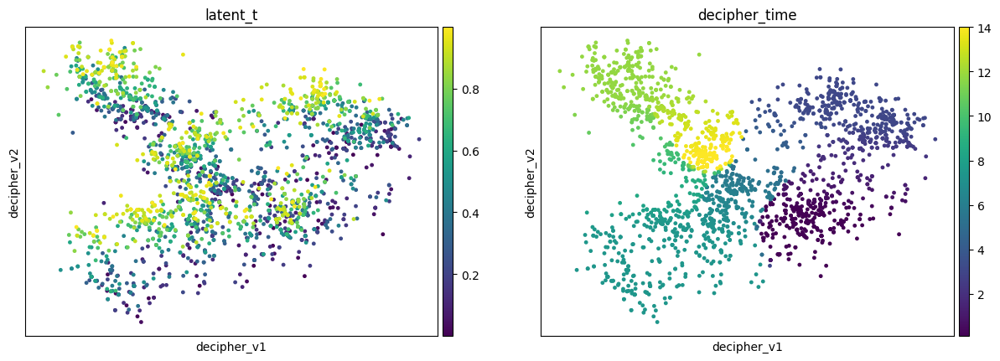

Decipher-VZ, sigma=0.5, seed=0, rho = 0.1937


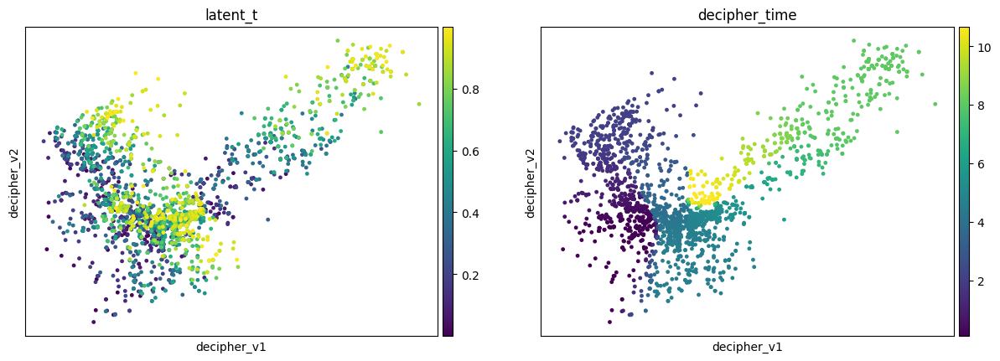

Decipher-VZ2, sigma=0.5, seed=0, rho = 0.2103


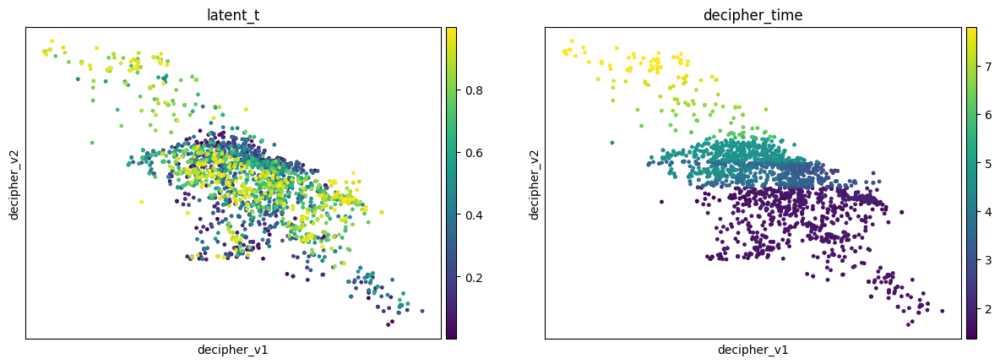

Decipher-MF, sigma=0.5, seed=0, rho = 0.0049


In [17]:
for model_name, (row, adata) in runs.items():
    sc.pl.embedding(adata, basis="decipher_v", color=["latent_t", "decipher_time"])
    print(f"{model_name}, sigma={sigma}, seed={row['seed']}, rho = {row['rho']:.4f}")

#### Ground truth vs. inferred z

Base Decipher  sigma=0.5  ground truth z silhouette (by batch) = 0.3318
Base Decipher  sigma=0.5  learned decipher_z silhouette (by batch) = 0.2261


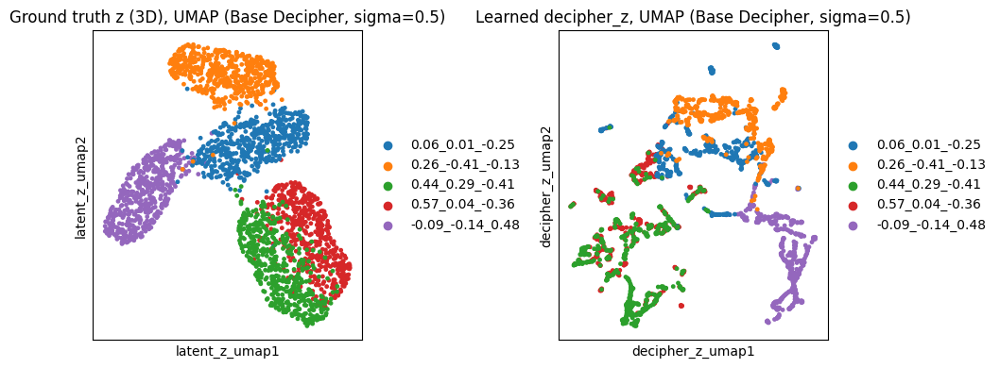

Decipher-VZ  sigma=0.5  ground truth z silhouette (by batch) = 0.3318
Decipher-VZ  sigma=0.5  learned decipher_z silhouette (by batch) = 0.4330


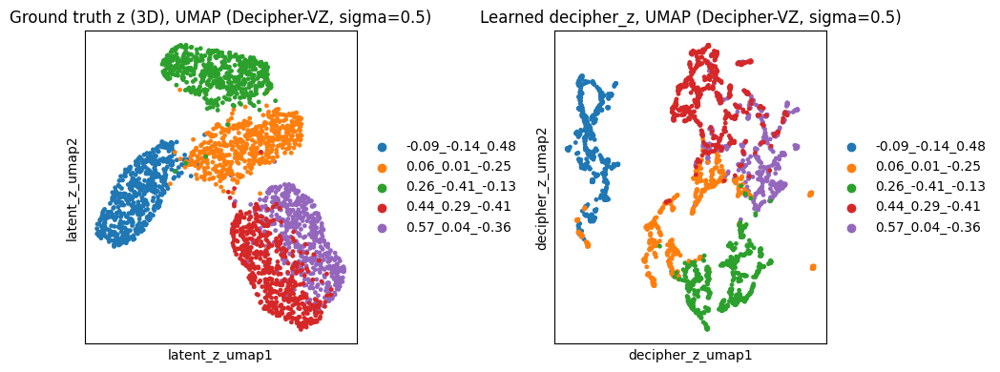

Decipher-VZ2  sigma=0.5  ground truth z silhouette (by batch) = 0.3318
Decipher-VZ2  sigma=0.5  learned decipher_z silhouette (by batch) = 0.2633


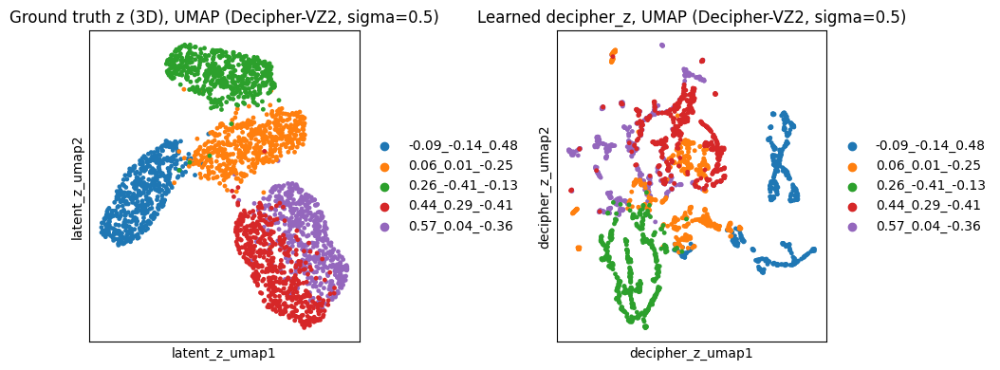

Decipher-MF  sigma=0.5  ground truth z silhouette (by batch) = 0.3318
Decipher-MF  sigma=0.5  learned decipher_z silhouette (by batch) = 0.1513


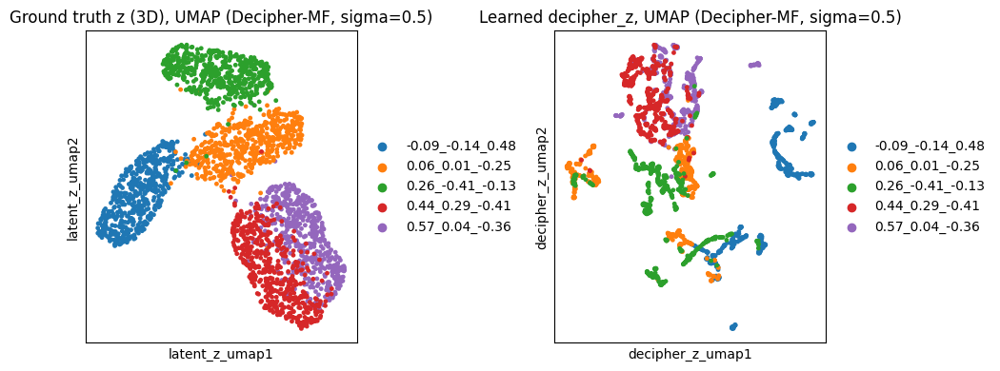

In [18]:
for model_name, (row, adata) in runs.items():
    batch_labels = adata.obs["batch"].astype(str)

    sil_ground_truth = silhouette_score(
        adata.obs[latent_z_cols].values, batch_labels,
        sample_size=min(5000, adata.n_obs), random_state=42,
    )
    sil_learned = silhouette_score(
        adata.obsm["decipher_z"], batch_labels,
        sample_size=min(5000, adata.n_obs), random_state=42,
    )
    print(f"{model_name}  sigma={sigma}  ground truth z silhouette (by batch) = {sil_ground_truth:.4f}")
    print(f"{model_name}  sigma={sigma}  learned decipher_z silhouette (by batch) = {sil_learned:.4f}")

    adata.obsm["latent_z"] = adata.obs[latent_z_cols].values
    sc.pp.neighbors(adata, use_rep="latent_z", key_added="latent_z_neighbors", random_state=42)
    sc.tl.umap(adata, neighbors_key="latent_z_neighbors", random_state=42)
    adata.obsm["latent_z_umap"] = adata.obsm["X_umap"]

    sc.pp.neighbors(adata, use_rep="decipher_z", random_state=42)
    sc.tl.umap(adata, random_state=42)
    adata.obsm["decipher_z_umap"] = adata.obsm["X_umap"]

    fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(10, 4))
    sc.pl.embedding(adata, basis="latent_z_umap", color="batch",
                    ax=axes[0], show=False, title=f"Ground truth z (3D), UMAP ({model_name}, sigma={sigma})")
    sc.pl.embedding(adata, basis="decipher_z_umap", color="batch",
                    ax=axes[1], show=False, title=f"Learned decipher_z, UMAP ({model_name}, sigma={sigma})")
    plt.tight_layout()
    plt.show()

#### V-space integration (scib_metrics)

In [19]:
for model_name, (row, adata) in runs.items():
    m = compute_integration_metrics(adata, v_key="decipher_v", batch_key="batch", t_key="latent_t",
                                     n_neighbors=30, n_bins=5)
    print(f"{model_name}  sigma={sigma}  seed={row['seed']}  "
          f"iLISI={m['ilisi']:.4f}  graph_conn={m['graph_conn']:.4f}  sil_batch={m['sil_batch']:.4f}")

Base Decipher  sigma=0.5  seed=0  iLISI=0.0118  graph_conn=0.4444  sil_batch=0.5888
Decipher-VZ  sigma=0.5  seed=0  iLISI=0.0000  graph_conn=0.3204  sil_batch=0.4455
Decipher-VZ2  sigma=0.5  seed=0  iLISI=0.0055  graph_conn=0.5632  sil_batch=0.5212
Decipher-MF  sigma=0.5  seed=0  iLISI=0.1146  graph_conn=0.3096  sil_batch=0.6612


### Sigma = 1.0

In [20]:
sigma = 1.0
runs = {name: load_run(results_df, sigma, name, seed=seed_for_detail) for name in model_names}

/Users/alanxie/miniconda3/envs/decipher_env/lib/python3.11/site-packages/anndata/_core/anndata.py:1754: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")
/Users/alanxie/miniconda3/envs/decipher_env/lib/python3.11/site-packages/anndata/_core/anndata.py:1754: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")
/Users/alanxie/miniconda3/envs/decipher_env/lib/python3.11/site-packages/anndata/_core/anndata.py:1754: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")
/Users/alanxie/miniconda3/envs/decipher_env/lib/python3.11/site-packages/anndata/_core/anndata.py:1754: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


#### Latent vs. learned pseudotime

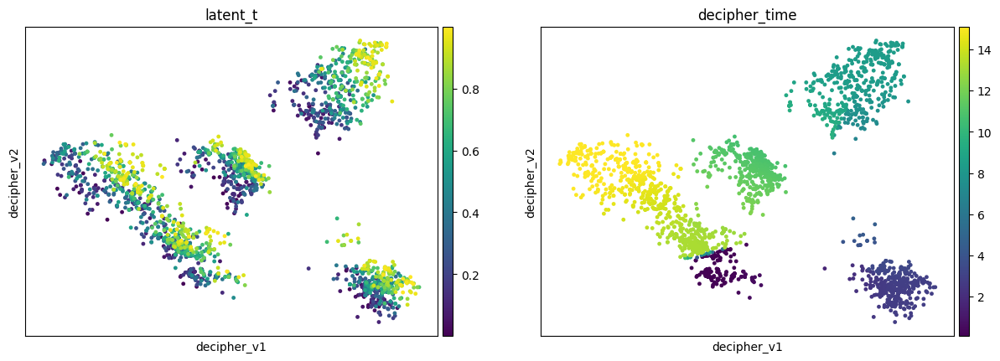

Base Decipher, sigma=1.0, seed=0, rho = 0.0975


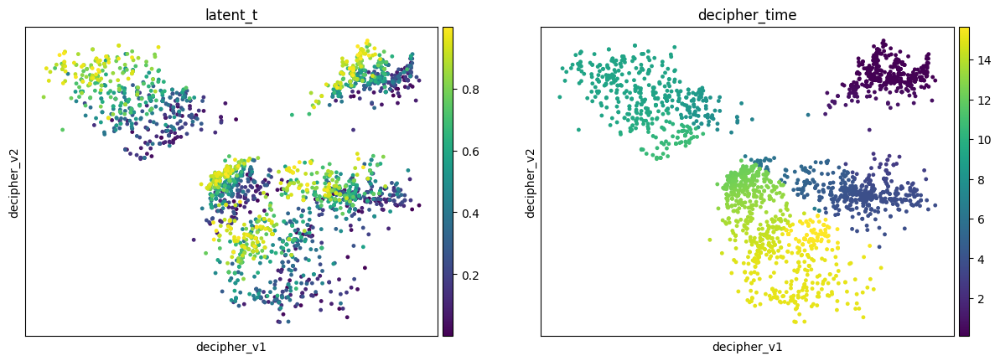

Decipher-VZ, sigma=1.0, seed=0, rho = 0.0315


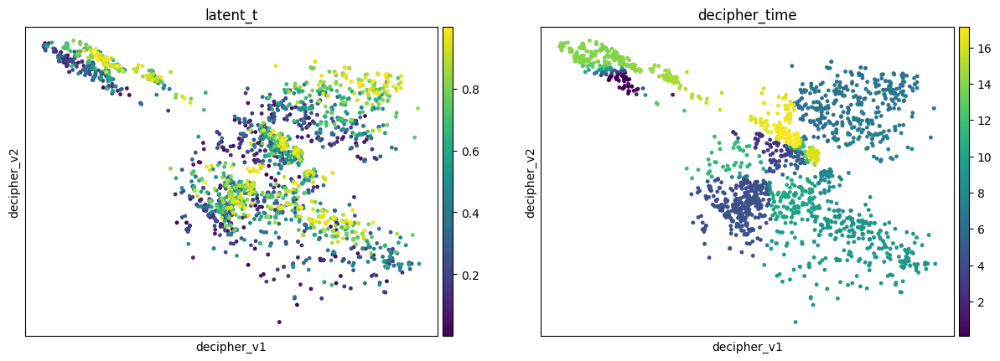

Decipher-VZ2, sigma=1.0, seed=0, rho = 0.1498


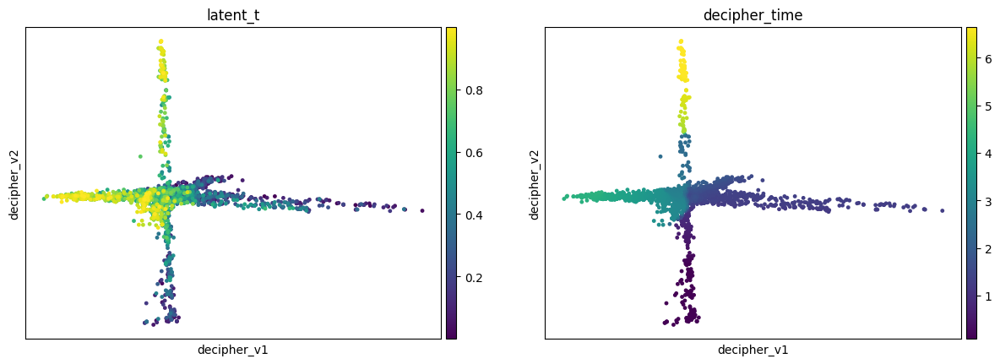

Decipher-MF, sigma=1.0, seed=0, rho = 0.6815


In [21]:
for model_name, (row, adata) in runs.items():
    sc.pl.embedding(adata, basis="decipher_v", color=["latent_t", "decipher_time"])
    print(f"{model_name}, sigma={sigma}, seed={row['seed']}, rho = {row['rho']:.4f}")

#### Ground truth vs. inferred z

Base Decipher  sigma=1.0  ground truth z silhouette (by batch) = 0.6037
Base Decipher  sigma=1.0  learned decipher_z silhouette (by batch) = 0.6845


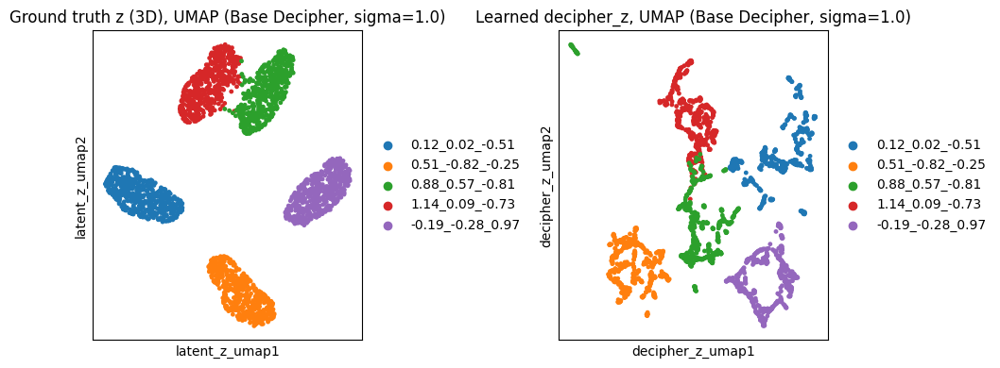

Decipher-VZ  sigma=1.0  ground truth z silhouette (by batch) = 0.6037
Decipher-VZ  sigma=1.0  learned decipher_z silhouette (by batch) = 0.6938


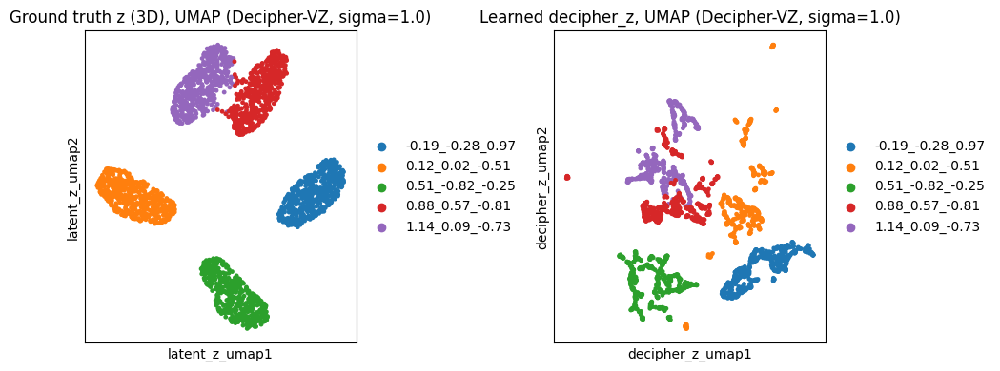

Decipher-VZ2  sigma=1.0  ground truth z silhouette (by batch) = 0.6037
Decipher-VZ2  sigma=1.0  learned decipher_z silhouette (by batch) = 0.5868


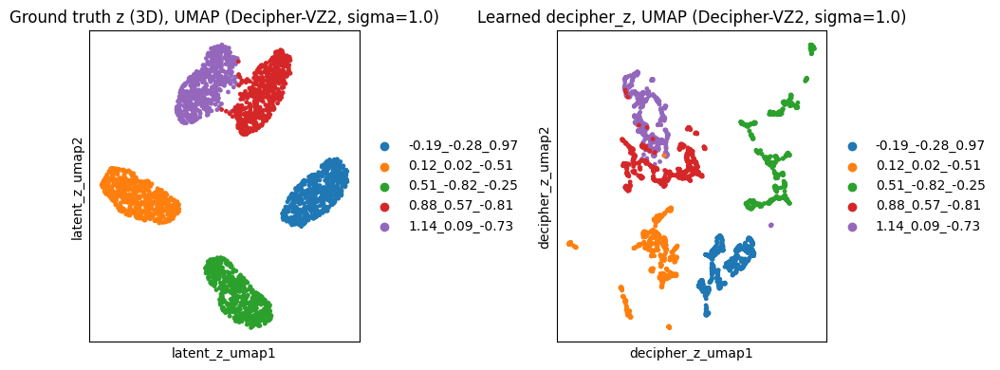

Decipher-MF  sigma=1.0  ground truth z silhouette (by batch) = 0.6037
Decipher-MF  sigma=1.0  learned decipher_z silhouette (by batch) = 0.6378


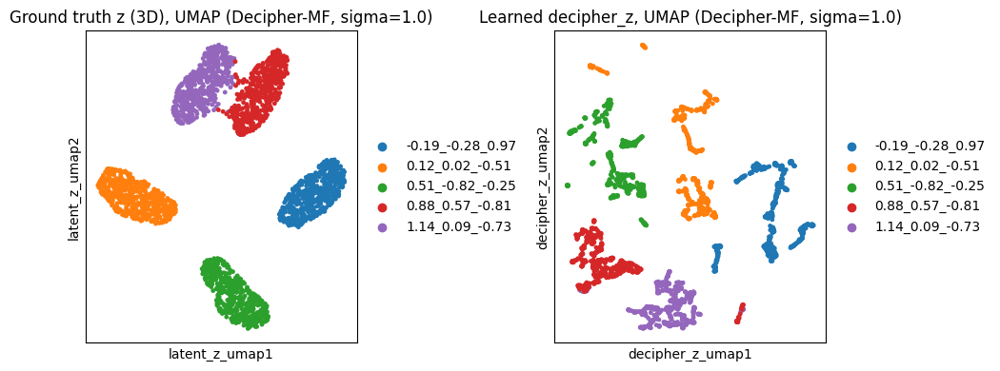

In [22]:
for model_name, (row, adata) in runs.items():
    batch_labels = adata.obs["batch"].astype(str)

    sil_ground_truth = silhouette_score(
        adata.obs[latent_z_cols].values, batch_labels,
        sample_size=min(5000, adata.n_obs), random_state=42,
    )
    sil_learned = silhouette_score(
        adata.obsm["decipher_z"], batch_labels,
        sample_size=min(5000, adata.n_obs), random_state=42,
    )
    print(f"{model_name}  sigma={sigma}  ground truth z silhouette (by batch) = {sil_ground_truth:.4f}")
    print(f"{model_name}  sigma={sigma}  learned decipher_z silhouette (by batch) = {sil_learned:.4f}")

    adata.obsm["latent_z"] = adata.obs[latent_z_cols].values
    sc.pp.neighbors(adata, use_rep="latent_z", key_added="latent_z_neighbors", random_state=42)
    sc.tl.umap(adata, neighbors_key="latent_z_neighbors", random_state=42)
    adata.obsm["latent_z_umap"] = adata.obsm["X_umap"]

    sc.pp.neighbors(adata, use_rep="decipher_z", random_state=42)
    sc.tl.umap(adata, random_state=42)
    adata.obsm["decipher_z_umap"] = adata.obsm["X_umap"]

    fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(10, 4))
    sc.pl.embedding(adata, basis="latent_z_umap", color="batch",
                    ax=axes[0], show=False, title=f"Ground truth z (3D), UMAP ({model_name}, sigma={sigma})")
    sc.pl.embedding(adata, basis="decipher_z_umap", color="batch",
                    ax=axes[1], show=False, title=f"Learned decipher_z, UMAP ({model_name}, sigma={sigma})")
    plt.tight_layout()
    plt.show()

#### V-space integration (scib_metrics)

In [23]:
for model_name, (row, adata) in runs.items():
    m = compute_integration_metrics(adata, v_key="decipher_v", batch_key="batch", t_key="latent_t",
                                     n_neighbors=30, n_bins=5)
    print(f"{model_name}  sigma={sigma}  seed={row['seed']}  "
          f"iLISI={m['ilisi']:.4f}  graph_conn={m['graph_conn']:.4f}  sil_batch={m['sil_batch']:.4f}")

Base Decipher  sigma=1.0  seed=0  iLISI=0.0000  graph_conn=0.2744  sil_batch=0.2704
Decipher-VZ  sigma=1.0  seed=0  iLISI=0.0000  graph_conn=0.3268  sil_batch=0.2989
Decipher-VZ2  sigma=1.0  seed=0  iLISI=0.0000  graph_conn=0.2804  sil_batch=0.4252
Decipher-MF  sigma=1.0  seed=0  iLISI=0.0326  graph_conn=0.6132  sil_batch=0.6324


### Sigma = 2.0

In [24]:
sigma = 2.0
runs = {name: load_run(results_df, sigma, name, seed=seed_for_detail) for name in model_names}

/Users/alanxie/miniconda3/envs/decipher_env/lib/python3.11/site-packages/anndata/_core/anndata.py:1754: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")
/Users/alanxie/miniconda3/envs/decipher_env/lib/python3.11/site-packages/anndata/_core/anndata.py:1754: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")
/Users/alanxie/miniconda3/envs/decipher_env/lib/python3.11/site-packages/anndata/_core/anndata.py:1754: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")
/Users/alanxie/miniconda3/envs/decipher_env/lib/python3.11/site-packages/anndata/_core/anndata.py:1754: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


#### Latent vs. learned pseudotime

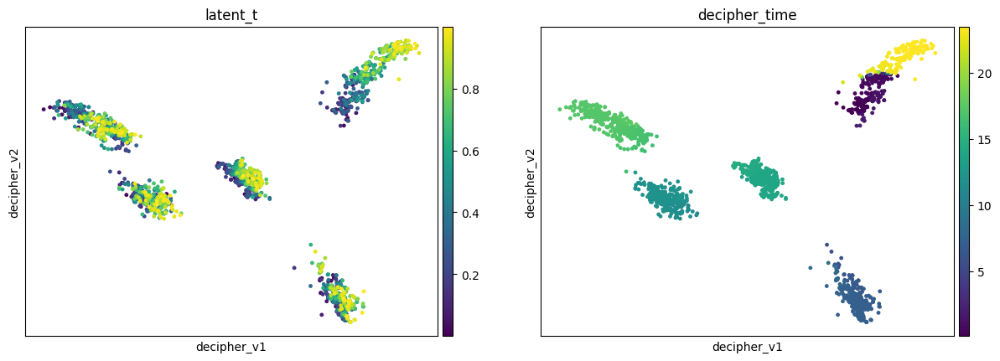

Base Decipher, sigma=2.0, seed=0, rho = 0.2424


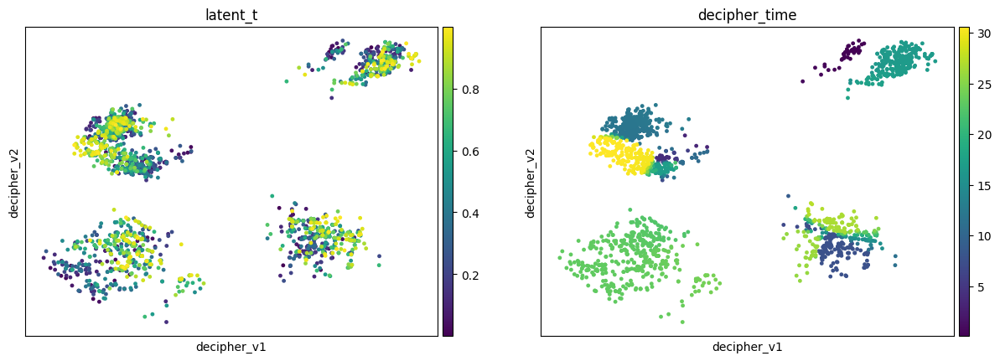

Decipher-VZ, sigma=2.0, seed=0, rho = 0.2089


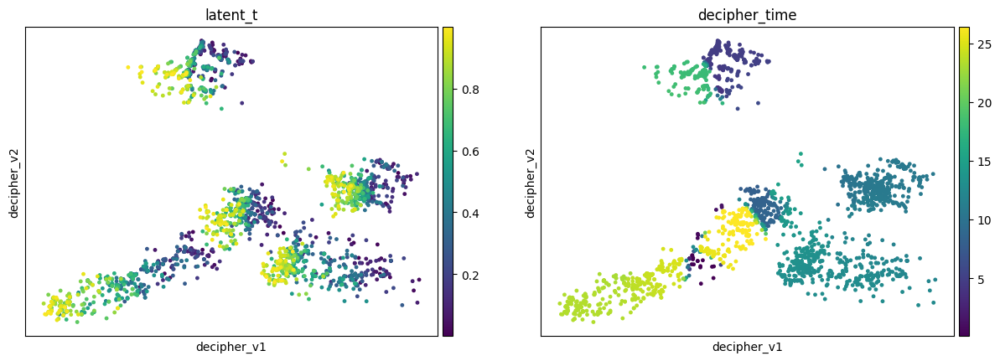

Decipher-VZ2, sigma=2.0, seed=0, rho = 0.2789


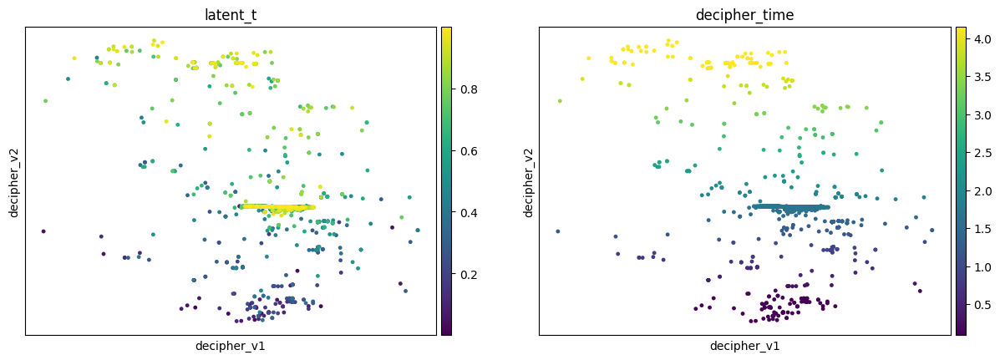

Decipher-MF, sigma=2.0, seed=0, rho = 0.2523


In [25]:
for model_name, (row, adata) in runs.items():
    sc.pl.embedding(adata, basis="decipher_v", color=["latent_t", "decipher_time"])
    print(f"{model_name}, sigma={sigma}, seed={row['seed']}, rho = {row['rho']:.4f}")

#### Ground truth vs. inferred z

Base Decipher  sigma=2.0  ground truth z silhouette (by batch) = 0.7918
Base Decipher  sigma=2.0  learned decipher_z silhouette (by batch) = 0.8149


/Users/alanxie/miniconda3/envs/decipher_env/lib/python3.11/site-packages/scipy/sparse/_index.py:151: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


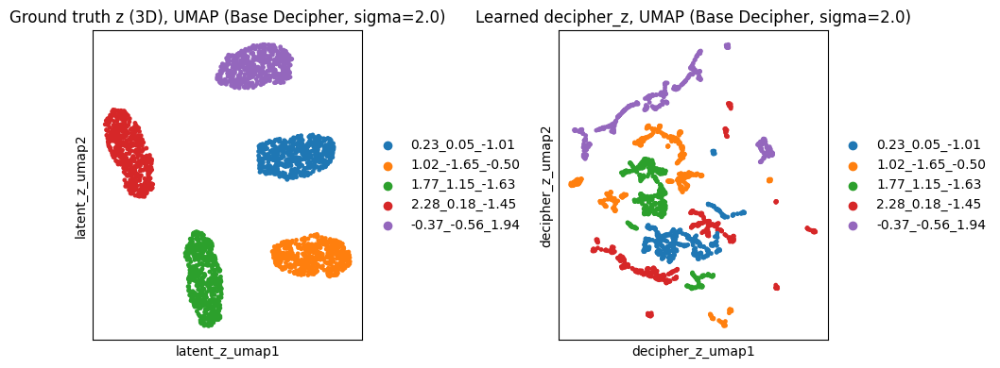

Decipher-VZ  sigma=2.0  ground truth z silhouette (by batch) = 0.7918
Decipher-VZ  sigma=2.0  learned decipher_z silhouette (by batch) = 0.8451


/Users/alanxie/miniconda3/envs/decipher_env/lib/python3.11/site-packages/scipy/sparse/_index.py:151: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


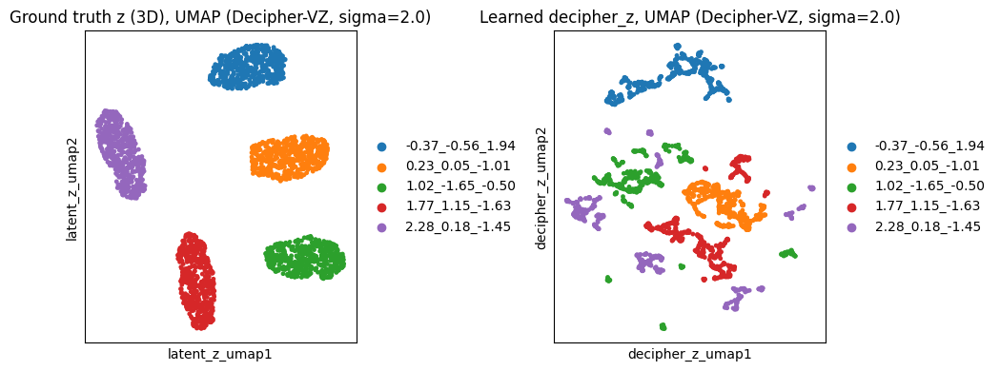

Decipher-VZ2  sigma=2.0  ground truth z silhouette (by batch) = 0.7918
Decipher-VZ2  sigma=2.0  learned decipher_z silhouette (by batch) = 0.6759


/Users/alanxie/miniconda3/envs/decipher_env/lib/python3.11/site-packages/scipy/sparse/_index.py:151: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


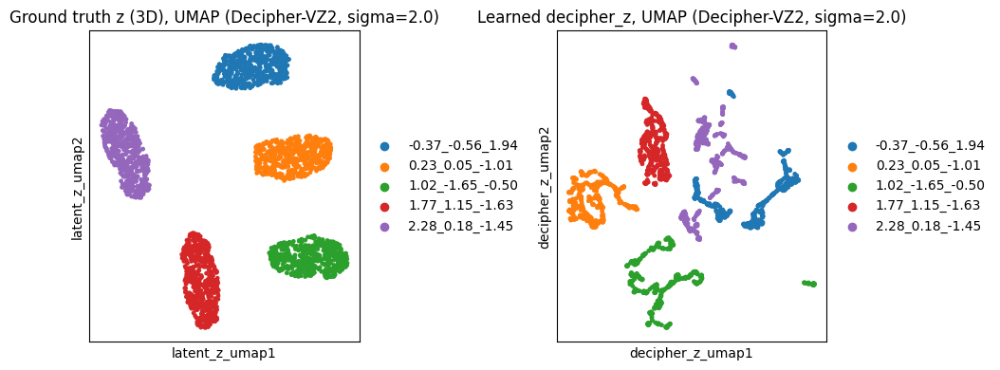

Decipher-MF  sigma=2.0  ground truth z silhouette (by batch) = 0.7918
Decipher-MF  sigma=2.0  learned decipher_z silhouette (by batch) = 0.6617


/Users/alanxie/miniconda3/envs/decipher_env/lib/python3.11/site-packages/scipy/sparse/_index.py:151: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


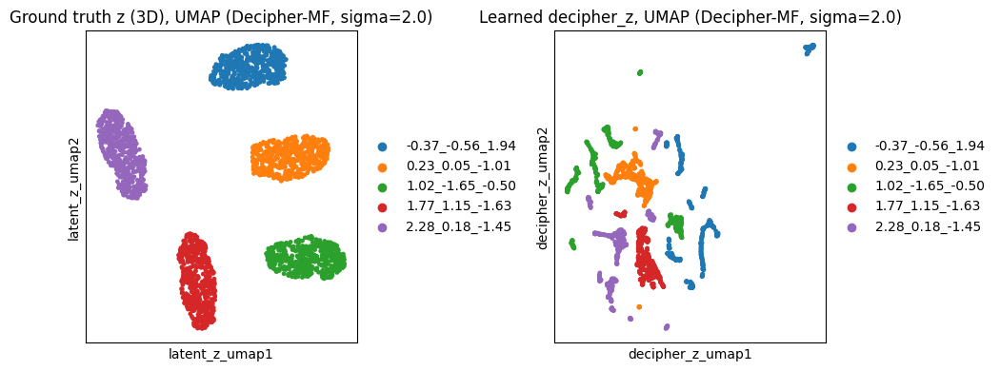

In [26]:
for model_name, (row, adata) in runs.items():
    batch_labels = adata.obs["batch"].astype(str)

    sil_ground_truth = silhouette_score(
        adata.obs[latent_z_cols].values, batch_labels,
        sample_size=min(5000, adata.n_obs), random_state=42,
    )
    sil_learned = silhouette_score(
        adata.obsm["decipher_z"], batch_labels,
        sample_size=min(5000, adata.n_obs), random_state=42,
    )
    print(f"{model_name}  sigma={sigma}  ground truth z silhouette (by batch) = {sil_ground_truth:.4f}")
    print(f"{model_name}  sigma={sigma}  learned decipher_z silhouette (by batch) = {sil_learned:.4f}")

    adata.obsm["latent_z"] = adata.obs[latent_z_cols].values
    sc.pp.neighbors(adata, use_rep="latent_z", key_added="latent_z_neighbors", random_state=42)
    sc.tl.umap(adata, neighbors_key="latent_z_neighbors", random_state=42)
    adata.obsm["latent_z_umap"] = adata.obsm["X_umap"]

    sc.pp.neighbors(adata, use_rep="decipher_z", random_state=42)
    sc.tl.umap(adata, random_state=42)
    adata.obsm["decipher_z_umap"] = adata.obsm["X_umap"]

    fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(10, 4))
    sc.pl.embedding(adata, basis="latent_z_umap", color="batch",
                    ax=axes[0], show=False, title=f"Ground truth z (3D), UMAP ({model_name}, sigma={sigma})")
    sc.pl.embedding(adata, basis="decipher_z_umap", color="batch",
                    ax=axes[1], show=False, title=f"Learned decipher_z, UMAP ({model_name}, sigma={sigma})")
    plt.tight_layout()
    plt.show()

#### V-space integration (scib_metrics)

In [27]:
for model_name, (row, adata) in runs.items():
    m = compute_integration_metrics(adata, v_key="decipher_v", batch_key="batch", t_key="latent_t",
                                     n_neighbors=30, n_bins=5)
    print(f"{model_name}  sigma={sigma}  seed={row['seed']}  "
          f"iLISI={m['ilisi']:.4f}  graph_conn={m['graph_conn']:.4f}  sil_batch={m['sil_batch']:.4f}")

Base Decipher  sigma=2.0  seed=0  iLISI=0.0000  graph_conn=0.1832  sil_batch=0.1607
Decipher-VZ  sigma=2.0  seed=0  iLISI=0.0000  graph_conn=0.1880  sil_batch=0.2811
Decipher-VZ2  sigma=2.0  seed=0  iLISI=0.0000  graph_conn=0.2372  sil_batch=0.2289
Decipher-MF  sigma=2.0  seed=0  iLISI=0.0184  graph_conn=0.1276  sil_batch=0.5348


### Sigma = 5.0

In [28]:
sigma = 5.0
runs = {name: load_run(results_df, sigma, name, seed=seed_for_detail) for name in model_names}

/Users/alanxie/miniconda3/envs/decipher_env/lib/python3.11/site-packages/anndata/_core/anndata.py:1754: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")
/Users/alanxie/miniconda3/envs/decipher_env/lib/python3.11/site-packages/anndata/_core/anndata.py:1754: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")
/Users/alanxie/miniconda3/envs/decipher_env/lib/python3.11/site-packages/anndata/_core/anndata.py:1754: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")
/Users/alanxie/miniconda3/envs/decipher_env/lib/python3.11/site-packages/anndata/_core/anndata.py:1754: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


#### Latent vs. learned pseudotime

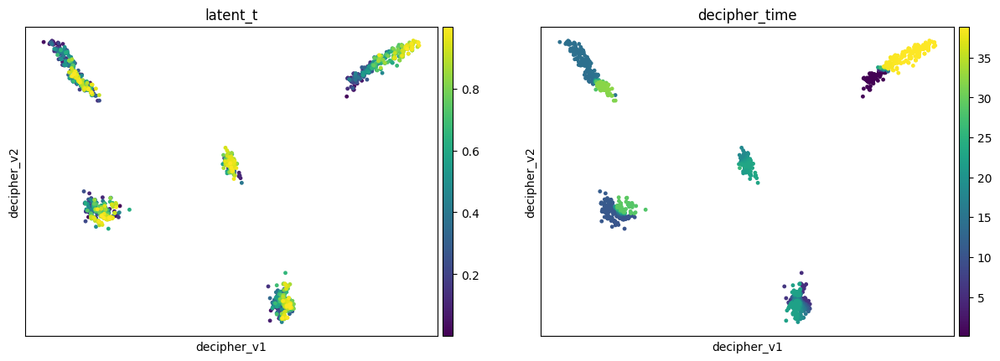

Base Decipher, sigma=5.0, seed=0, rho = 0.1847


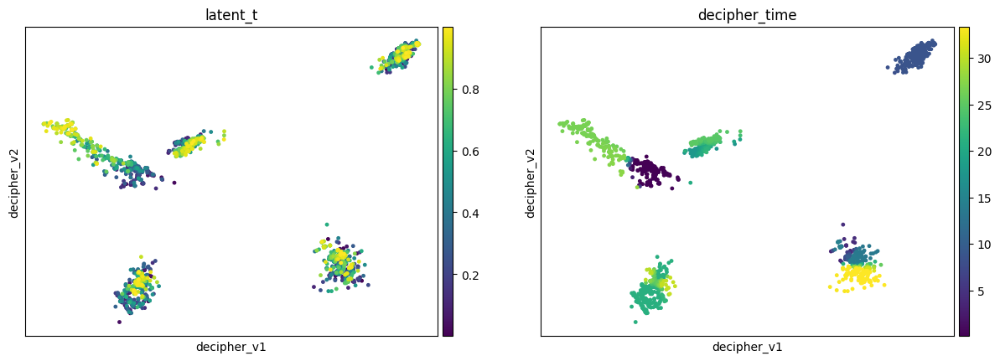

Decipher-VZ, sigma=5.0, seed=0, rho = 0.1237


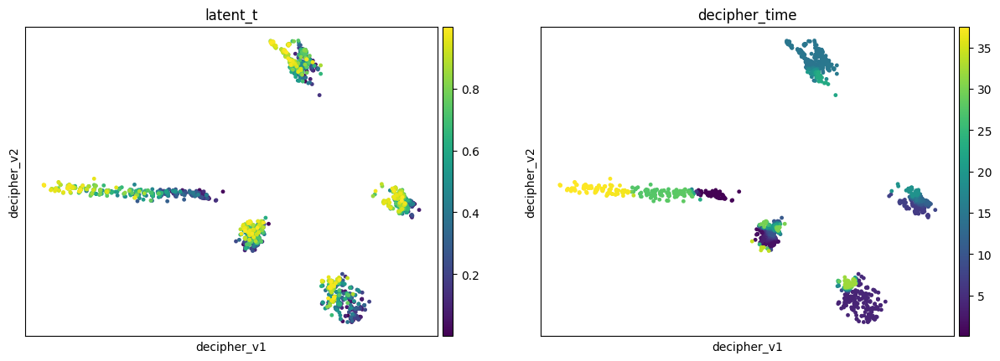

Decipher-VZ2, sigma=5.0, seed=0, rho = 0.3201


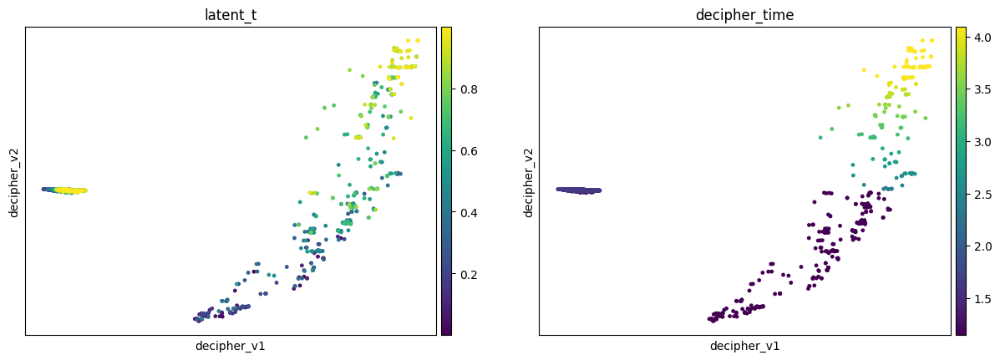

Decipher-MF, sigma=5.0, seed=0, rho = 0.1913


In [29]:
for model_name, (row, adata) in runs.items():
    sc.pl.embedding(adata, basis="decipher_v", color=["latent_t", "decipher_time"])
    print(f"{model_name}, sigma={sigma}, seed={row['seed']}, rho = {row['rho']:.4f}")

#### Ground truth vs. inferred z

Base Decipher  sigma=5.0  ground truth z silhouette (by batch) = 0.9160
Base Decipher  sigma=5.0  learned decipher_z silhouette (by batch) = 0.9040


/Users/alanxie/miniconda3/envs/decipher_env/lib/python3.11/site-packages/scipy/sparse/_index.py:151: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


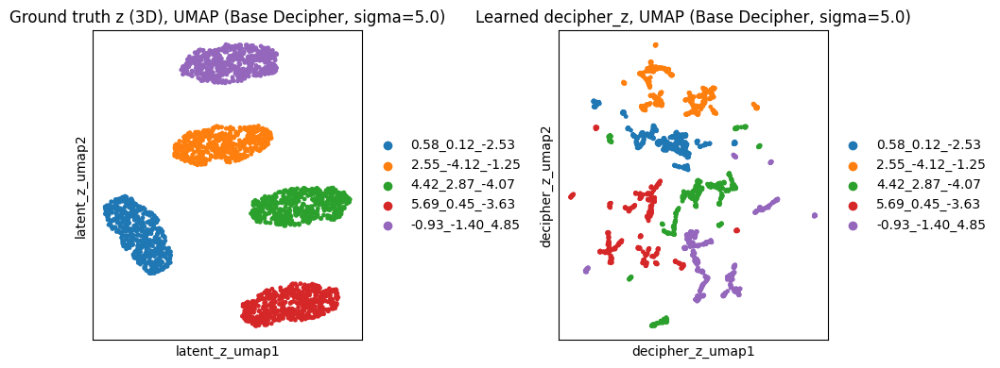

Decipher-VZ  sigma=5.0  ground truth z silhouette (by batch) = 0.9160
Decipher-VZ  sigma=5.0  learned decipher_z silhouette (by batch) = 0.9280


/Users/alanxie/miniconda3/envs/decipher_env/lib/python3.11/site-packages/scipy/sparse/_index.py:151: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


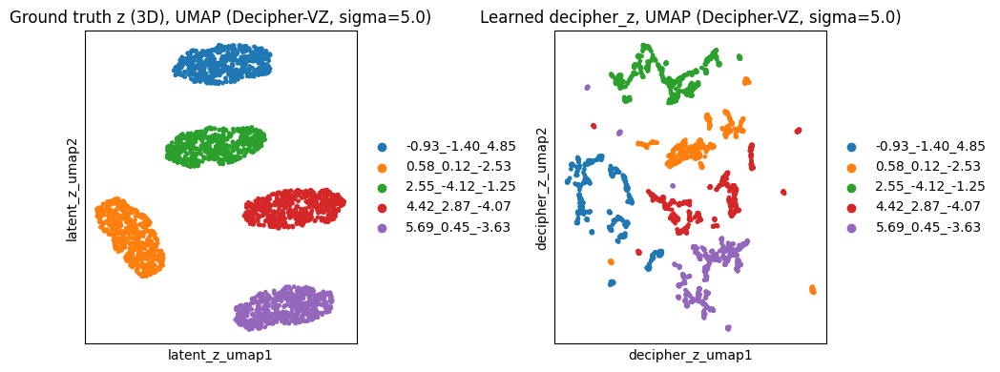

Decipher-VZ2  sigma=5.0  ground truth z silhouette (by batch) = 0.9160
Decipher-VZ2  sigma=5.0  learned decipher_z silhouette (by batch) = 0.8920


/Users/alanxie/miniconda3/envs/decipher_env/lib/python3.11/site-packages/scipy/sparse/_index.py:151: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


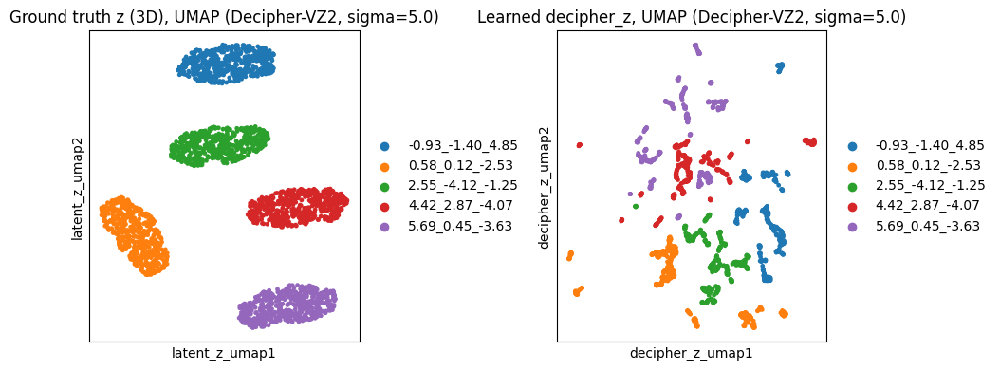

Decipher-MF  sigma=5.0  ground truth z silhouette (by batch) = 0.9160
Decipher-MF  sigma=5.0  learned decipher_z silhouette (by batch) = 0.9074


/Users/alanxie/miniconda3/envs/decipher_env/lib/python3.11/site-packages/scipy/sparse/_index.py:151: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


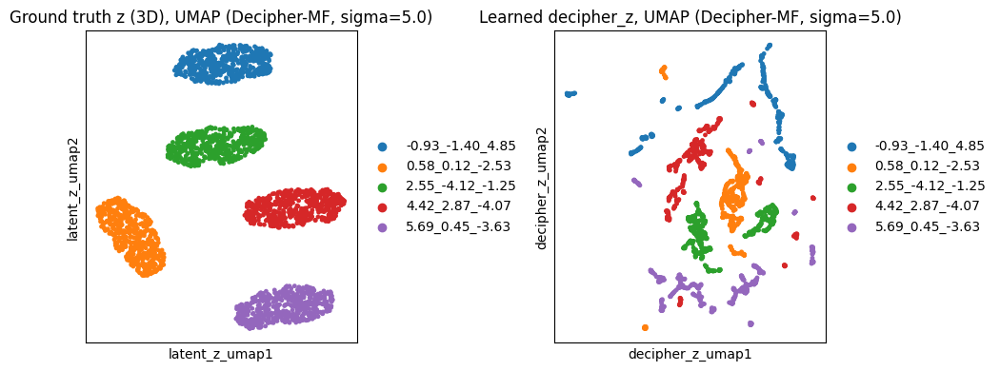

In [30]:
for model_name, (row, adata) in runs.items():
    batch_labels = adata.obs["batch"].astype(str)

    sil_ground_truth = silhouette_score(
        adata.obs[latent_z_cols].values, batch_labels,
        sample_size=min(5000, adata.n_obs), random_state=42,
    )
    sil_learned = silhouette_score(
        adata.obsm["decipher_z"], batch_labels,
        sample_size=min(5000, adata.n_obs), random_state=42,
    )
    print(f"{model_name}  sigma={sigma}  ground truth z silhouette (by batch) = {sil_ground_truth:.4f}")
    print(f"{model_name}  sigma={sigma}  learned decipher_z silhouette (by batch) = {sil_learned:.4f}")

    adata.obsm["latent_z"] = adata.obs[latent_z_cols].values
    sc.pp.neighbors(adata, use_rep="latent_z", key_added="latent_z_neighbors", random_state=42)
    sc.tl.umap(adata, neighbors_key="latent_z_neighbors", random_state=42)
    adata.obsm["latent_z_umap"] = adata.obsm["X_umap"]

    sc.pp.neighbors(adata, use_rep="decipher_z", random_state=42)
    sc.tl.umap(adata, random_state=42)
    adata.obsm["decipher_z_umap"] = adata.obsm["X_umap"]

    fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(10, 4))
    sc.pl.embedding(adata, basis="latent_z_umap", color="batch",
                    ax=axes[0], show=False, title=f"Ground truth z (3D), UMAP ({model_name}, sigma={sigma})")
    sc.pl.embedding(adata, basis="decipher_z_umap", color="batch",
                    ax=axes[1], show=False, title=f"Learned decipher_z, UMAP ({model_name}, sigma={sigma})")
    plt.tight_layout()
    plt.show()

#### V-space integration (scib_metrics)

In [31]:
for model_name, (row, adata) in runs.items():
    m = compute_integration_metrics(adata, v_key="decipher_v", batch_key="batch", t_key="latent_t",
                                     n_neighbors=30, n_bins=5)
    print(f"{model_name}  sigma={sigma}  seed={row['seed']}  "
          f"iLISI={m['ilisi']:.4f}  graph_conn={m['graph_conn']:.4f}  sil_batch={m['sil_batch']:.4f}")

Base Decipher  sigma=5.0  seed=0  iLISI=0.0000  graph_conn=0.1588  sil_batch=0.0747
Decipher-VZ  sigma=5.0  seed=0  iLISI=0.0000  graph_conn=0.1612  sil_batch=0.1408
Decipher-VZ2  sigma=5.0  seed=0  iLISI=0.0000  graph_conn=0.1428  sil_batch=0.1209
Decipher-MF  sigma=5.0  seed=0  iLISI=0.0000  graph_conn=0.1472  sil_batch=0.4584


### Sigma = 7.5

In [32]:
sigma = 7.5
runs = {name: load_run(results_df, sigma, name, seed=seed_for_detail) for name in model_names}

/Users/alanxie/miniconda3/envs/decipher_env/lib/python3.11/site-packages/anndata/_core/anndata.py:1754: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")
/Users/alanxie/miniconda3/envs/decipher_env/lib/python3.11/site-packages/anndata/_core/anndata.py:1754: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")
/Users/alanxie/miniconda3/envs/decipher_env/lib/python3.11/site-packages/anndata/_core/anndata.py:1754: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")
/Users/alanxie/miniconda3/envs/decipher_env/lib/python3.11/site-packages/anndata/_core/anndata.py:1754: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


#### Latent vs. learned pseudotime

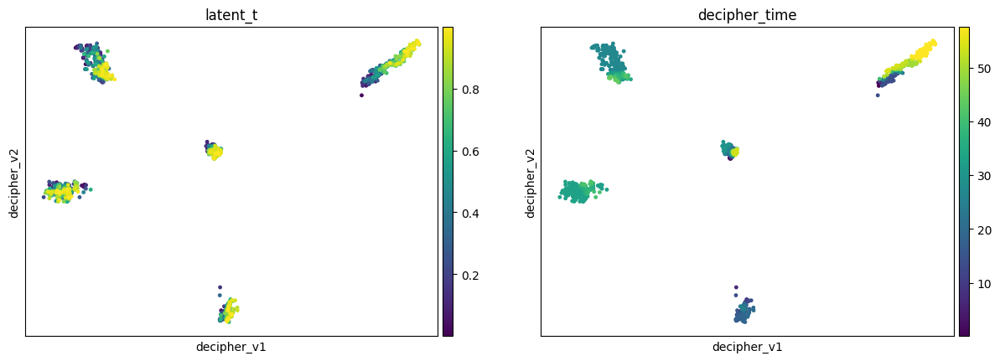

Base Decipher, sigma=7.5, seed=0, rho = 0.3200


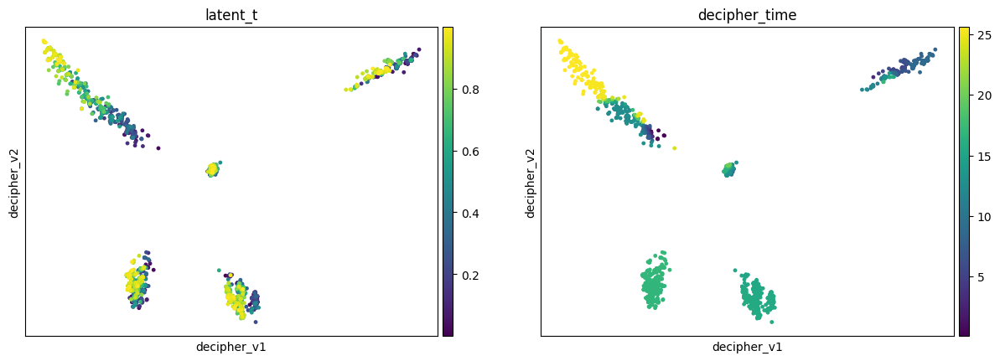

Decipher-VZ, sigma=7.5, seed=0, rho = 0.2501


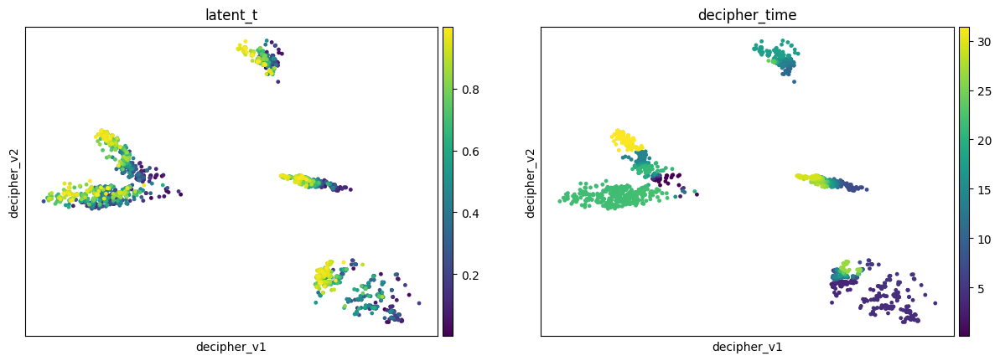

Decipher-VZ2, sigma=7.5, seed=0, rho = 0.3601


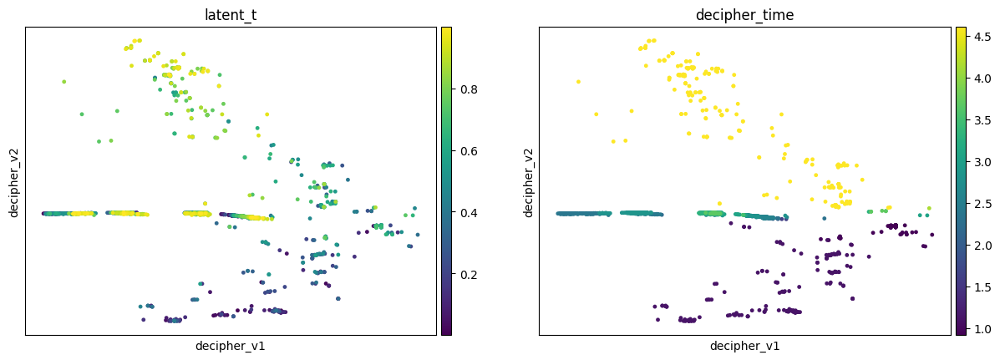

Decipher-MF, sigma=7.5, seed=0, rho = 0.1338


In [33]:
for model_name, (row, adata) in runs.items():
    sc.pl.embedding(adata, basis="decipher_v", color=["latent_t", "decipher_time"])
    print(f"{model_name}, sigma={sigma}, seed={row['seed']}, rho = {row['rho']:.4f}")

#### Ground truth vs. inferred z

Base Decipher  sigma=7.5  ground truth z silhouette (by batch) = 0.9440
Base Decipher  sigma=7.5  learned decipher_z silhouette (by batch) = 0.9310


/Users/alanxie/miniconda3/envs/decipher_env/lib/python3.11/site-packages/scipy/sparse/_index.py:151: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


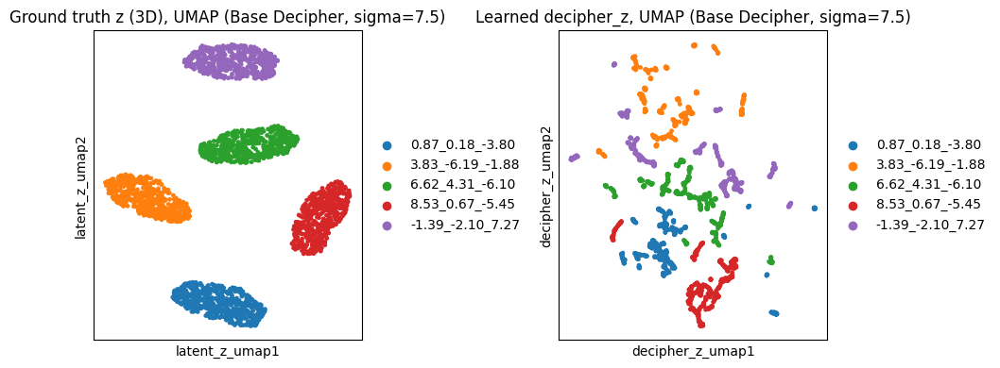

Decipher-VZ  sigma=7.5  ground truth z silhouette (by batch) = 0.9440
Decipher-VZ  sigma=7.5  learned decipher_z silhouette (by batch) = 0.9405


/Users/alanxie/miniconda3/envs/decipher_env/lib/python3.11/site-packages/scipy/sparse/_index.py:151: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


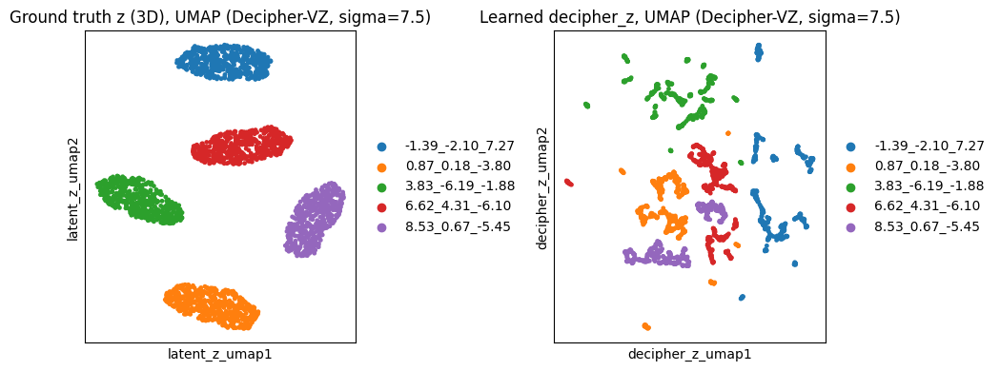

Decipher-VZ2  sigma=7.5  ground truth z silhouette (by batch) = 0.9440
Decipher-VZ2  sigma=7.5  learned decipher_z silhouette (by batch) = 0.9219


/Users/alanxie/miniconda3/envs/decipher_env/lib/python3.11/site-packages/scipy/sparse/_index.py:151: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


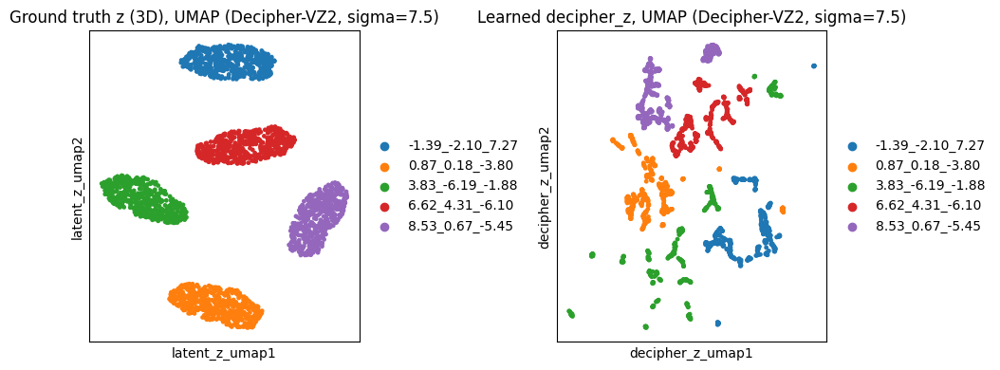

Decipher-MF  sigma=7.5  ground truth z silhouette (by batch) = 0.9440
Decipher-MF  sigma=7.5  learned decipher_z silhouette (by batch) = 0.9153


/Users/alanxie/miniconda3/envs/decipher_env/lib/python3.11/site-packages/scipy/sparse/_index.py:151: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


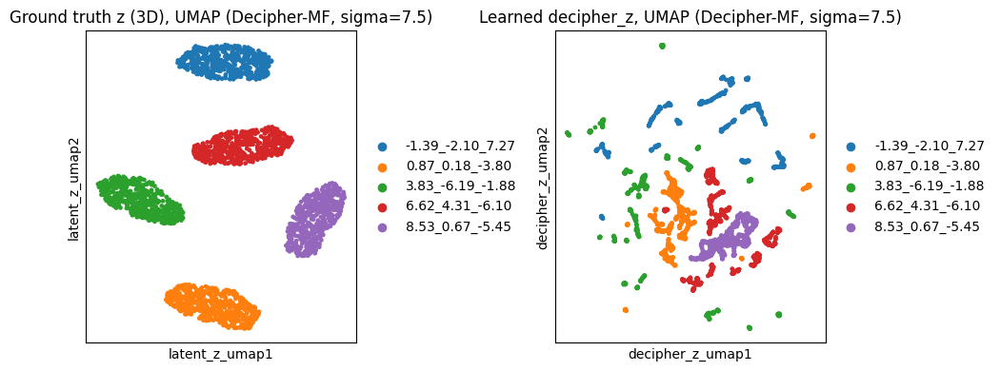

In [34]:
for model_name, (row, adata) in runs.items():
    batch_labels = adata.obs["batch"].astype(str)

    sil_ground_truth = silhouette_score(
        adata.obs[latent_z_cols].values, batch_labels,
        sample_size=min(5000, adata.n_obs), random_state=42,
    )
    sil_learned = silhouette_score(
        adata.obsm["decipher_z"], batch_labels,
        sample_size=min(5000, adata.n_obs), random_state=42,
    )
    print(f"{model_name}  sigma={sigma}  ground truth z silhouette (by batch) = {sil_ground_truth:.4f}")
    print(f"{model_name}  sigma={sigma}  learned decipher_z silhouette (by batch) = {sil_learned:.4f}")

    adata.obsm["latent_z"] = adata.obs[latent_z_cols].values
    sc.pp.neighbors(adata, use_rep="latent_z", key_added="latent_z_neighbors", random_state=42)
    sc.tl.umap(adata, neighbors_key="latent_z_neighbors", random_state=42)
    adata.obsm["latent_z_umap"] = adata.obsm["X_umap"]

    sc.pp.neighbors(adata, use_rep="decipher_z", random_state=42)
    sc.tl.umap(adata, random_state=42)
    adata.obsm["decipher_z_umap"] = adata.obsm["X_umap"]

    fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(10, 4))
    sc.pl.embedding(adata, basis="latent_z_umap", color="batch",
                    ax=axes[0], show=False, title=f"Ground truth z (3D), UMAP ({model_name}, sigma={sigma})")
    sc.pl.embedding(adata, basis="decipher_z_umap", color="batch",
                    ax=axes[1], show=False, title=f"Learned decipher_z, UMAP ({model_name}, sigma={sigma})")
    plt.tight_layout()
    plt.show()

#### V-space integration (scib_metrics)

In [35]:
for model_name, (row, adata) in runs.items():
    m = compute_integration_metrics(adata, v_key="decipher_v", batch_key="batch", t_key="latent_t",
                                     n_neighbors=30, n_bins=5)
    print(f"{model_name}  sigma={sigma}  seed={row['seed']}  "
          f"iLISI={m['ilisi']:.4f}  graph_conn={m['graph_conn']:.4f}  sil_batch={m['sil_batch']:.4f}")

Base Decipher  sigma=7.5  seed=0  iLISI=0.0000  graph_conn=0.1720  sil_batch=0.0581
Decipher-VZ  sigma=7.5  seed=0  iLISI=0.0000  graph_conn=0.1572  sil_batch=0.1089
Decipher-VZ2  sigma=7.5  seed=0  iLISI=0.0000  graph_conn=0.1704  sil_batch=0.1608
Decipher-MF  sigma=7.5  seed=0  iLISI=0.0000  graph_conn=0.1768  sil_batch=0.2854


### Sigma = 10.0

In [36]:
sigma = 10.0
runs = {name: load_run(results_df, sigma, name, seed=seed_for_detail) for name in model_names}

/Users/alanxie/miniconda3/envs/decipher_env/lib/python3.11/site-packages/anndata/_core/anndata.py:1754: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")
/Users/alanxie/miniconda3/envs/decipher_env/lib/python3.11/site-packages/anndata/_core/anndata.py:1754: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")
/Users/alanxie/miniconda3/envs/decipher_env/lib/python3.11/site-packages/anndata/_core/anndata.py:1754: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")
/Users/alanxie/miniconda3/envs/decipher_env/lib/python3.11/site-packages/anndata/_core/anndata.py:1754: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


#### Latent vs. learned pseudotime

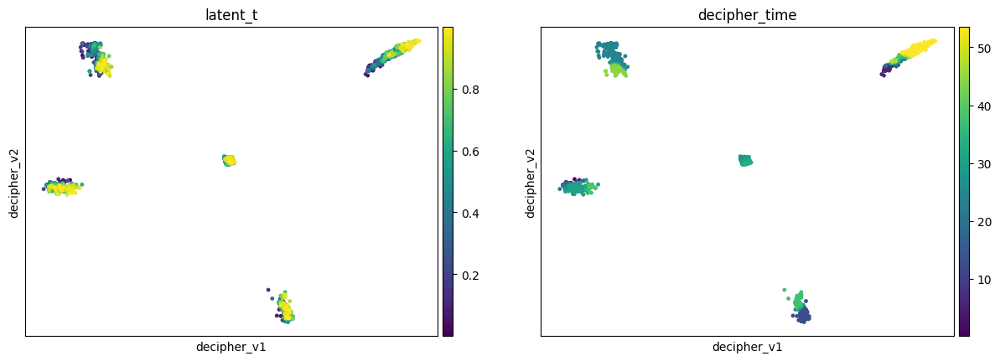

Base Decipher, sigma=10.0, seed=0, rho = 0.3659


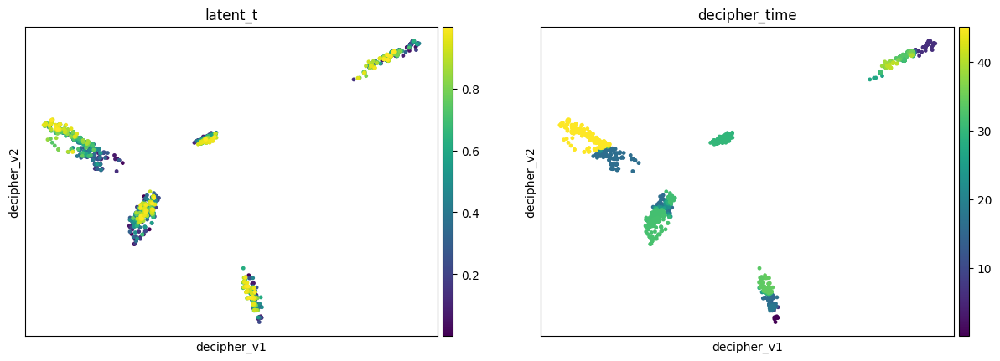

Decipher-VZ, sigma=10.0, seed=0, rho = 0.3113


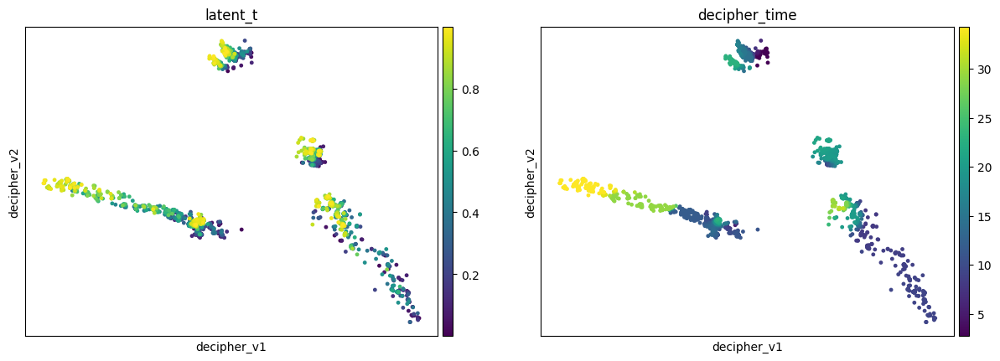

Decipher-VZ2, sigma=10.0, seed=0, rho = 0.5115


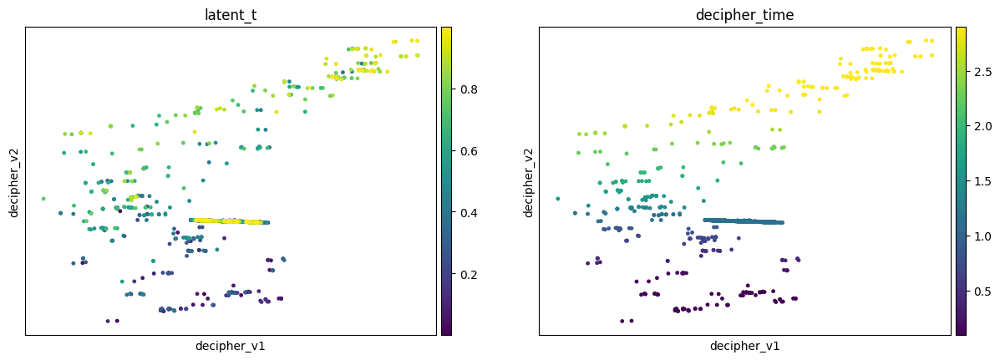

Decipher-MF, sigma=10.0, seed=0, rho = 0.1132


In [37]:
for model_name, (row, adata) in runs.items():
    sc.pl.embedding(adata, basis="decipher_v", color=["latent_t", "decipher_time"])
    print(f"{model_name}, sigma={sigma}, seed={row['seed']}, rho = {row['rho']:.4f}")

#### Ground truth vs. inferred z

Base Decipher  sigma=10.0  ground truth z silhouette (by batch) = 0.9580
Base Decipher  sigma=10.0  learned decipher_z silhouette (by batch) = 0.9413


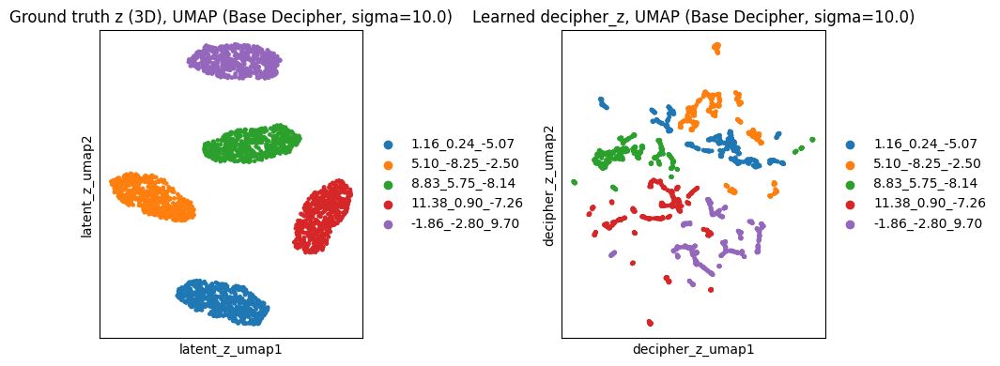

Decipher-VZ  sigma=10.0  ground truth z silhouette (by batch) = 0.9580
Decipher-VZ  sigma=10.0  learned decipher_z silhouette (by batch) = 0.9457


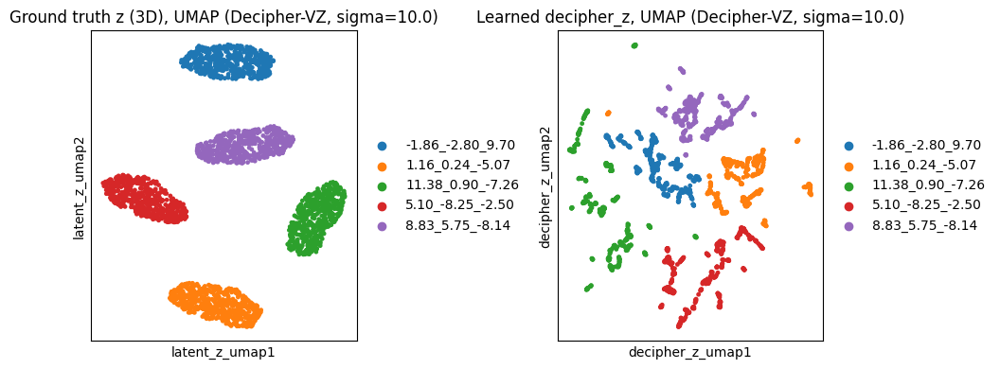

Decipher-VZ2  sigma=10.0  ground truth z silhouette (by batch) = 0.9580
Decipher-VZ2  sigma=10.0  learned decipher_z silhouette (by batch) = 0.9172


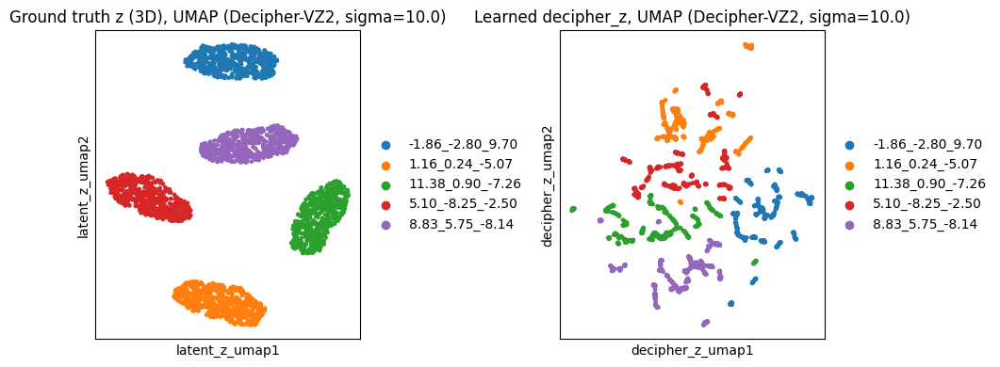

Decipher-MF  sigma=10.0  ground truth z silhouette (by batch) = 0.9580
Decipher-MF  sigma=10.0  learned decipher_z silhouette (by batch) = 0.9218


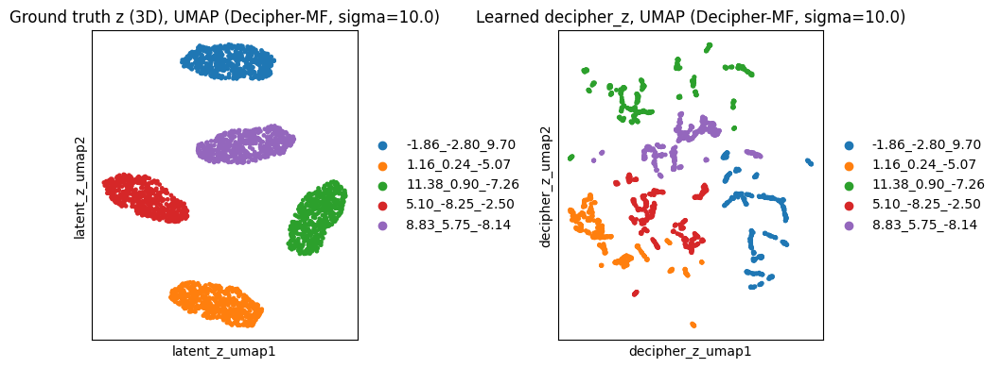

In [38]:
for model_name, (row, adata) in runs.items():
    batch_labels = adata.obs["batch"].astype(str)

    sil_ground_truth = silhouette_score(
        adata.obs[latent_z_cols].values, batch_labels,
        sample_size=min(5000, adata.n_obs), random_state=42,
    )
    sil_learned = silhouette_score(
        adata.obsm["decipher_z"], batch_labels,
        sample_size=min(5000, adata.n_obs), random_state=42,
    )
    print(f"{model_name}  sigma={sigma}  ground truth z silhouette (by batch) = {sil_ground_truth:.4f}")
    print(f"{model_name}  sigma={sigma}  learned decipher_z silhouette (by batch) = {sil_learned:.4f}")

    adata.obsm["latent_z"] = adata.obs[latent_z_cols].values
    sc.pp.neighbors(adata, use_rep="latent_z", key_added="latent_z_neighbors", random_state=42)
    sc.tl.umap(adata, neighbors_key="latent_z_neighbors", random_state=42)
    adata.obsm["latent_z_umap"] = adata.obsm["X_umap"]

    sc.pp.neighbors(adata, use_rep="decipher_z", random_state=42)
    sc.tl.umap(adata, random_state=42)
    adata.obsm["decipher_z_umap"] = adata.obsm["X_umap"]

    fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(10, 4))
    sc.pl.embedding(adata, basis="latent_z_umap", color="batch",
                    ax=axes[0], show=False, title=f"Ground truth z (3D), UMAP ({model_name}, sigma={sigma})")
    sc.pl.embedding(adata, basis="decipher_z_umap", color="batch",
                    ax=axes[1], show=False, title=f"Learned decipher_z, UMAP ({model_name}, sigma={sigma})")
    plt.tight_layout()
    plt.show()

#### V-space integration (scib_metrics)

In [39]:
for model_name, (row, adata) in runs.items():
    m = compute_integration_metrics(adata, v_key="decipher_v", batch_key="batch", t_key="latent_t",
                                     n_neighbors=30, n_bins=5)
    print(f"{model_name}  sigma={sigma}  seed={row['seed']}  "
          f"iLISI={m['ilisi']:.4f}  graph_conn={m['graph_conn']:.4f}  sil_batch={m['sil_batch']:.4f}")

Base Decipher  sigma=10.0  seed=0  iLISI=0.0000  graph_conn=0.1488  sil_batch=0.0461
Decipher-VZ  sigma=10.0  seed=0  iLISI=0.0000  graph_conn=0.1388  sil_batch=0.1052
Decipher-VZ2  sigma=10.0  seed=0  iLISI=0.0000  graph_conn=0.1628  sil_batch=0.2574
Decipher-MF  sigma=10.0  seed=0  iLISI=0.0000  graph_conn=0.1564  sil_batch=0.4714


## Leiden resolution sweep (post-hoc reprocessing, no retraining)

Tests whether the `decipher_time` collapse found earlier (at `leiden_resolution=0.05`, batch-pure clusters give the trajectory fit too few 'steps' to resolve within-batch pseudotime) is fixable by adjusting clustering resolution.

This reprocesses the already-trained `.h5ad` files from the sweep above: reloads `decipher_z`/`decipher_v`, reruns `cell_clusters` -> `trajectories` -> `decipher_rotate_space` -> `decipher_time` with a new resolution, and recomputes rho. **No retraining** — `cell_clusters` only runs scanpy neighbors+leiden on the already-saved `decipher_z`.

Writes to a separate `leiden_resolution_sweep/` folder with resolution baked into every filename — never overwrites the original sweep's `.h5ad`/CSV files or the n_neighbors sweep's outputs.

In [ ]:
import importlib
from scipy.stats import spearmanr

leiden_resolutions = [0.02, 0.05, 0.1, 0.5, 1.0]
seed_for_leiden_sweep = 0

leiden_dir = os.path.join(results_dir, "leiden_resolution_sweep")
os.makedirs(leiden_dir, exist_ok=True)
leiden_csv_path = os.path.join(leiden_dir, "leiden_resolution_sweep_seed0.csv")

leiden_records = []
seed0_runs = results_df[results_df["seed"] == seed_for_leiden_sweep]

for _, row in seed0_runs.iterrows():
    model_name = row["model"]
    model_tag = models[model_name]
    dc = importlib.import_module(model_tag)

    for res in leiden_resolutions:
        # fresh reload each time so re-clustering at a new resolution never
        # inherits state (obsm/obs columns) from a previous resolution's pass
        adata = sc.read_h5ad(row["trained_h5ad"])

        dc.tl.cell_clusters(adata, leiden_resolution=res, n_neighbors=25, seed=341)
        filtered = adata.obs["decipher_clusters"].value_counts() > 10
        filtered_ids = set(filtered[filtered].index)
        ground_truths = adata.obs.groupby('decipher_clusters')['latent_t'].mean().sort_values().index.to_list()
        ground_truths = [c for c in ground_truths if c in filtered_ids]
        dc.tl.trajectories(adata, dc.tl.TConfig('trajectory', cluster_ids_list=ground_truths))
        dc.tl.decipher_rotate_space(adata)
        dc.tl.decipher_time(adata)

        m = adata.obs["decipher_time"].notna()
        rho, _ = spearmanr(adata.obs["decipher_time"][m], adata.obs["latent_t"][m])
        n_clusters = adata.obs["decipher_clusters"].nunique()

        new_path = os.path.join(
            leiden_dir, f"sigma{row['sigma']}_seed{seed_for_leiden_sweep}_{model_tag}_leidenres{res}.h5ad"
        )
        adata.write(new_path)

        leiden_records.append({
            "model": model_name,
            "sigma": row["sigma"],
            "leiden_resolution": res,
            "n_clusters": n_clusters,
            "rho": abs(rho),
            "trained_h5ad": new_path,
        })
        pd.DataFrame(leiden_records).to_csv(leiden_csv_path, index=False)

leiden_results_df = pd.DataFrame(leiden_records)
leiden_results_df

### rho vs. Leiden resolution, faceted by sigma

In [ ]:
fig, axes = plt.subplots(2, 4, figsize=(20, 8), sharey=True)
axes = axes.flatten()
for ax, sigma in zip(axes, sigmas_sorted):
    sub_sigma = leiden_results_df[leiden_results_df["sigma"] == sigma]
    for name in models:
        sub = sub_sigma[sub_sigma["model"] == name].sort_values("leiden_resolution")
        ax.plot(sub["leiden_resolution"], sub["rho"], marker="o", color=colors[name], label=name, linewidth=2)
    ax.set_xscale("log")
    ax.set_xlabel("leiden_resolution")
    ax.set_title(f"sigma={sigma}")
    ax.set_ylim(0, 1)
    ax.spines[["top", "right"]].set_visible(False)
axes[0].set_ylabel(r"Spearman $|\rho|$")
axes[0].legend(frameon=False, fontsize=8)
for ax in axes[len(sigmas_sorted):]:
    ax.set_visible(False)
fig.suptitle("Trajectory recovery vs Leiden resolution, per sigma (seed=0)")
fig.tight_layout()
fig.savefig("leiden_resolution_vs_rho_3dz.png", dpi=200)
plt.show()

### Cluster count vs. Leiden resolution

In [ ]:
n_clusters_table = (leiden_results_df
    .pivot_table(index=["sigma", "leiden_resolution"], columns="model", values="n_clusters")
    .astype(int))
n_clusters_table

### rho table: original (leiden_resolution=0.05) vs. each tested resolution

In [ ]:
rho_table = (leiden_results_df
    .pivot_table(index=["sigma", "leiden_resolution"], columns="model", values="rho")
    .round(3))
rho_table

## Latent vs. learned pseudotime, recolored at Leiden resolution 0.5

`decipher_v` itself is identical regardless of Leiden resolution (`decipher_rotate_space` reloads the frozen trained model and redoes a deterministic forward pass; no rotation columns are passed in this pipeline, so no rotation happens either) -- only `decipher_time` changes, since it depends on the trajectory fit through the new clusters. So this section only recolors the existing scatter by the new `decipher_time`; it does not touch the Z-space UMAP comparison, which cannot change with resolution.

Reuses the already-reprocessed `.h5ad` files from the Leiden resolution sweep above (`leiden_resolution_sweep/`) -- pure loading and plotting, no new computation, no retraining.

In [ ]:
import os
import scanpy as sc
from scipy.stats import spearmanr

# Self-contained setup for this section -- safe to run on a fresh kernel
# without re-running the (expensive) training/V-metrics/Leiden sweep cells
# above. Values match those cells exactly, so this is a no-op if you did
# already run them.
results_dir = "/Users/alanxie/CodingProjects/Columbia/Azizi Lab/Spatial Nut Carcinoma/decipher-bc-methods/Data/Simulated Data/Simulated Adata/shift_sigma_sweep"
models = {
    "Base Decipher": "decipher",
    "Decipher-VZ": "decipher_vz",
    "Decipher-VZ2": "decipher_vz2",
    "Decipher-MF": "decipher_mf",
}
model_names = list(models.keys())
seed_for_detail = 0

leiden_res_for_recolor = 0.5
leiden_dir_for_recolor = os.path.join(results_dir, "leiden_resolution_sweep")

### Sigma = 0.1 (leiden_resolution=0.5)

In [ ]:
sigma = 0.1
runs_leiden = {}
for name in model_names:
    model_tag = models[name]
    path = os.path.join(
        leiden_dir_for_recolor,
        f"sigma{sigma}_seed{seed_for_detail}_{model_tag}_leidenres{leiden_res_for_recolor}.h5ad"
    )
    runs_leiden[name] = sc.read_h5ad(path)

for model_name, adata in runs_leiden.items():
    sc.pl.embedding(adata, basis="decipher_v", color=["latent_t", "decipher_time"])
    m = adata.obs["decipher_time"].notna()
    rho, _ = spearmanr(adata.obs["decipher_time"][m], adata.obs["latent_t"][m])
    print(f"{model_name}, sigma={sigma}, seed={seed_for_detail}, "
          f"leiden_resolution={leiden_res_for_recolor}, rho = {abs(rho):.4f}")

### Sigma = 0.5 (leiden_resolution=0.5)

In [ ]:
sigma = 0.5
runs_leiden = {}
for name in model_names:
    model_tag = models[name]
    path = os.path.join(
        leiden_dir_for_recolor,
        f"sigma{sigma}_seed{seed_for_detail}_{model_tag}_leidenres{leiden_res_for_recolor}.h5ad"
    )
    runs_leiden[name] = sc.read_h5ad(path)

for model_name, adata in runs_leiden.items():
    sc.pl.embedding(adata, basis="decipher_v", color=["latent_t", "decipher_time"])
    m = adata.obs["decipher_time"].notna()
    rho, _ = spearmanr(adata.obs["decipher_time"][m], adata.obs["latent_t"][m])
    print(f"{model_name}, sigma={sigma}, seed={seed_for_detail}, "
          f"leiden_resolution={leiden_res_for_recolor}, rho = {abs(rho):.4f}")

### Sigma = 1.0 (leiden_resolution=0.5)

In [ ]:
sigma = 1.0
runs_leiden = {}
for name in model_names:
    model_tag = models[name]
    path = os.path.join(
        leiden_dir_for_recolor,
        f"sigma{sigma}_seed{seed_for_detail}_{model_tag}_leidenres{leiden_res_for_recolor}.h5ad"
    )
    runs_leiden[name] = sc.read_h5ad(path)

for model_name, adata in runs_leiden.items():
    sc.pl.embedding(adata, basis="decipher_v", color=["latent_t", "decipher_time"])
    m = adata.obs["decipher_time"].notna()
    rho, _ = spearmanr(adata.obs["decipher_time"][m], adata.obs["latent_t"][m])
    print(f"{model_name}, sigma={sigma}, seed={seed_for_detail}, "
          f"leiden_resolution={leiden_res_for_recolor}, rho = {abs(rho):.4f}")

### Sigma = 2.0 (leiden_resolution=0.5)

In [ ]:
sigma = 2.0
runs_leiden = {}
for name in model_names:
    model_tag = models[name]
    path = os.path.join(
        leiden_dir_for_recolor,
        f"sigma{sigma}_seed{seed_for_detail}_{model_tag}_leidenres{leiden_res_for_recolor}.h5ad"
    )
    runs_leiden[name] = sc.read_h5ad(path)

for model_name, adata in runs_leiden.items():
    sc.pl.embedding(adata, basis="decipher_v", color=["latent_t", "decipher_time"])
    m = adata.obs["decipher_time"].notna()
    rho, _ = spearmanr(adata.obs["decipher_time"][m], adata.obs["latent_t"][m])
    print(f"{model_name}, sigma={sigma}, seed={seed_for_detail}, "
          f"leiden_resolution={leiden_res_for_recolor}, rho = {abs(rho):.4f}")

### Sigma = 5.0 (leiden_resolution=0.5)

In [ ]:
sigma = 5.0
runs_leiden = {}
for name in model_names:
    model_tag = models[name]
    path = os.path.join(
        leiden_dir_for_recolor,
        f"sigma{sigma}_seed{seed_for_detail}_{model_tag}_leidenres{leiden_res_for_recolor}.h5ad"
    )
    runs_leiden[name] = sc.read_h5ad(path)

for model_name, adata in runs_leiden.items():
    sc.pl.embedding(adata, basis="decipher_v", color=["latent_t", "decipher_time"])
    m = adata.obs["decipher_time"].notna()
    rho, _ = spearmanr(adata.obs["decipher_time"][m], adata.obs["latent_t"][m])
    print(f"{model_name}, sigma={sigma}, seed={seed_for_detail}, "
          f"leiden_resolution={leiden_res_for_recolor}, rho = {abs(rho):.4f}")

### Sigma = 7.5 (leiden_resolution=0.5)

In [ ]:
sigma = 7.5
runs_leiden = {}
for name in model_names:
    model_tag = models[name]
    path = os.path.join(
        leiden_dir_for_recolor,
        f"sigma{sigma}_seed{seed_for_detail}_{model_tag}_leidenres{leiden_res_for_recolor}.h5ad"
    )
    runs_leiden[name] = sc.read_h5ad(path)

for model_name, adata in runs_leiden.items():
    sc.pl.embedding(adata, basis="decipher_v", color=["latent_t", "decipher_time"])
    m = adata.obs["decipher_time"].notna()
    rho, _ = spearmanr(adata.obs["decipher_time"][m], adata.obs["latent_t"][m])
    print(f"{model_name}, sigma={sigma}, seed={seed_for_detail}, "
          f"leiden_resolution={leiden_res_for_recolor}, rho = {abs(rho):.4f}")

### Sigma = 10.0 (leiden_resolution=0.5)

In [ ]:
sigma = 10.0
runs_leiden = {}
for name in model_names:
    model_tag = models[name]
    path = os.path.join(
        leiden_dir_for_recolor,
        f"sigma{sigma}_seed{seed_for_detail}_{model_tag}_leidenres{leiden_res_for_recolor}.h5ad"
    )
    runs_leiden[name] = sc.read_h5ad(path)

for model_name, adata in runs_leiden.items():
    sc.pl.embedding(adata, basis="decipher_v", color=["latent_t", "decipher_time"])
    m = adata.obs["decipher_time"].notna()
    rho, _ = spearmanr(adata.obs["decipher_time"][m], adata.obs["latent_t"][m])
    print(f"{model_name}, sigma={sigma}, seed={seed_for_detail}, "
          f"leiden_resolution={leiden_res_for_recolor}, rho = {abs(rho):.4f}")